<a href="https://colab.research.google.com/github/DSWoodin/Practice/blob/main/PKNU_5th/02_ML/01_Scikitlearn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### 강의 분량
* 07월12일(금) 5시간 30분

### 강의 자료
* (수정)파이썬머신러닝02사이킷런.ipynb

### 이 장에서 배우는 것
* 머신러닝 소개
* 붓꽃 품종 예측 -> 분류(Classification)
* 의사결정나무분류 DecisionTreeClassifier()
* 데이터셋 분할 train_test_split()
* 모델 학습 fit()
* 모델 예측 predict()
* 모델 평가 accuracy_score
* 붓꽃 품종 예측 데이터 구성요소 확인 iris_data.keys()
* 교차 검증의 개념
* K폴드 교차 검증 KFold()
* Stratified K폴드 교차 검증 StratifiedKFold()
* 교차 검증을 간단하게 cross_val_score(), cross_validate()
* 교차 검증과 최적 하이퍼파리미터 튜닝을 한번에 GridSearchCV()
* 레이블 인코딩 LabelEncoder()
* 원핫 인코딩 OneHotEncoder(), pd.get_dummies()
* 피쳐 스케일링의 개념, 표준화, 정규화
* 표준화 StandardScaler(), MinMaxScaler()
* 학습 데이터와 테스트 데이터의 스케일링 변환 유의점
* 타이타닉 생존자 예측
* 사이킷런의 당뇨병 예제 문제

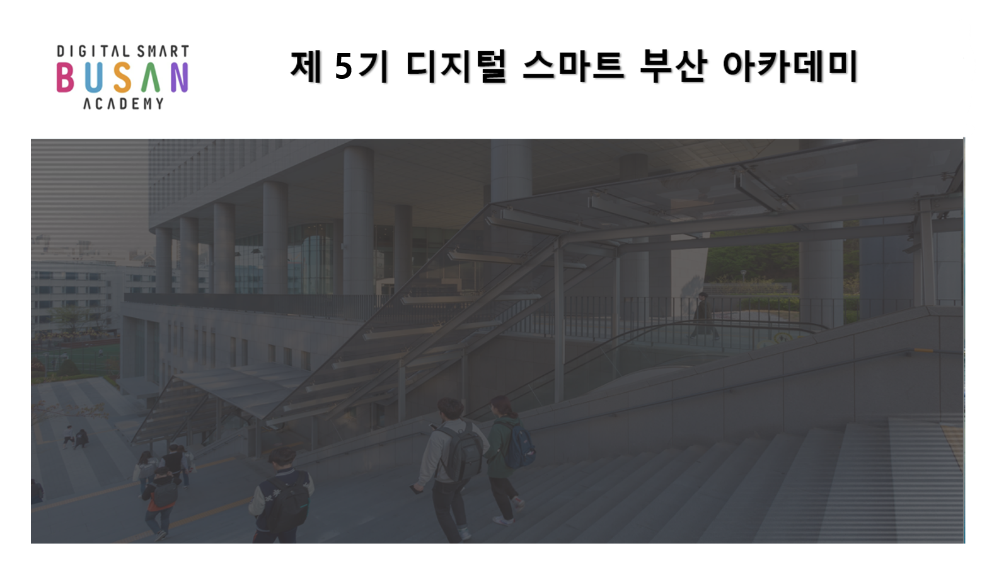

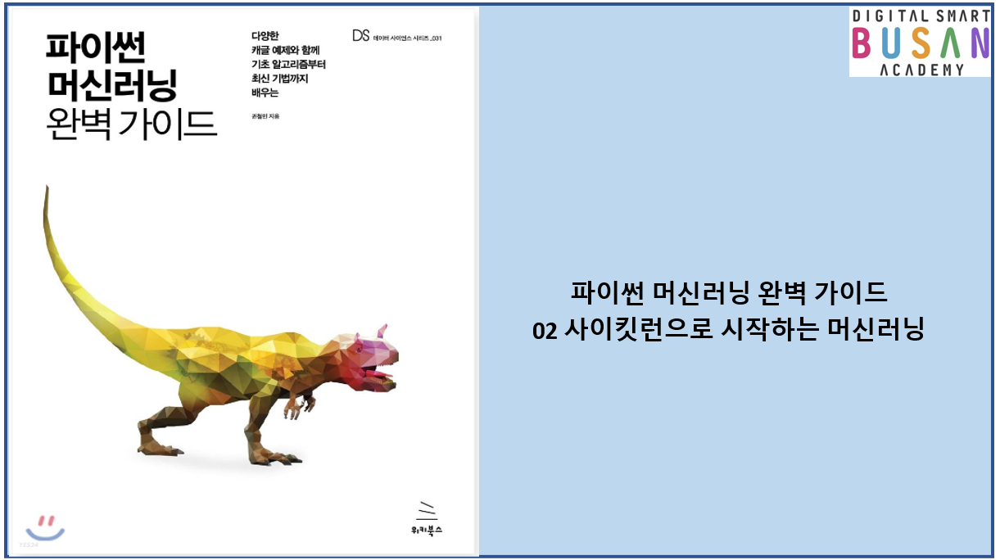

# **[머신러닝 소개]**

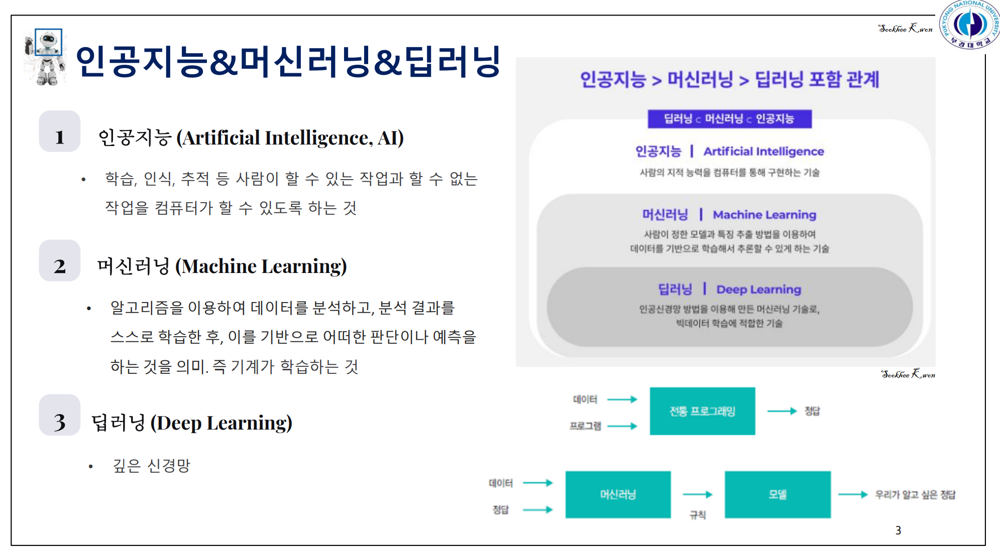

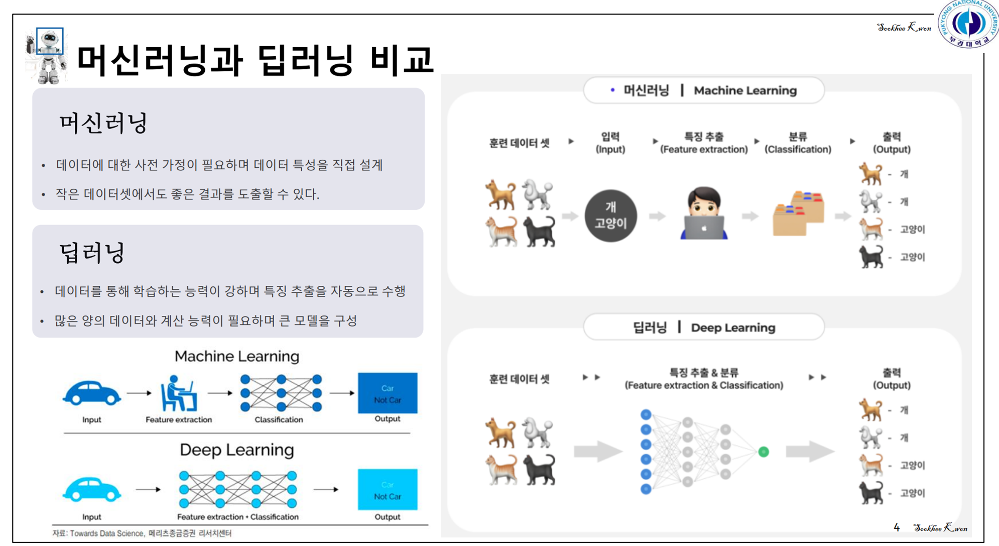

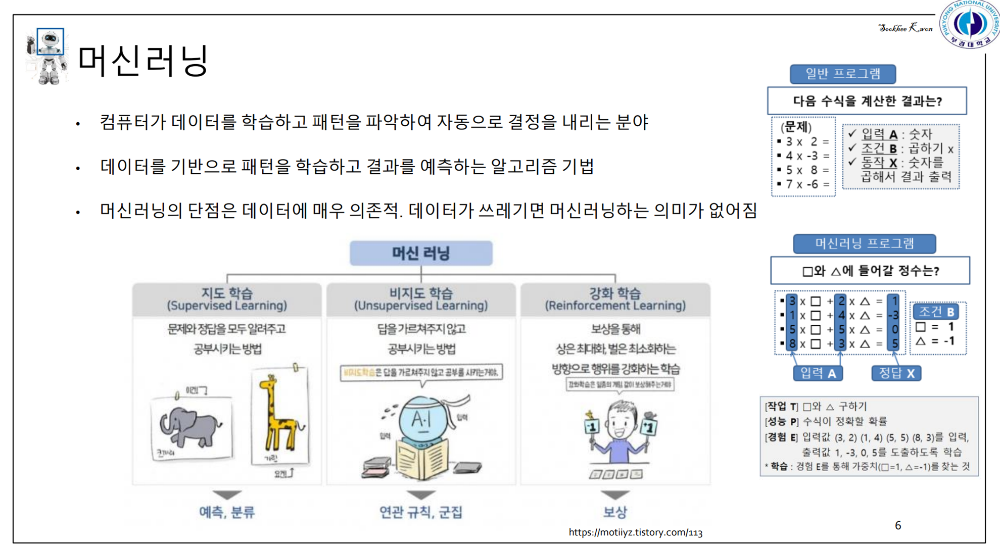

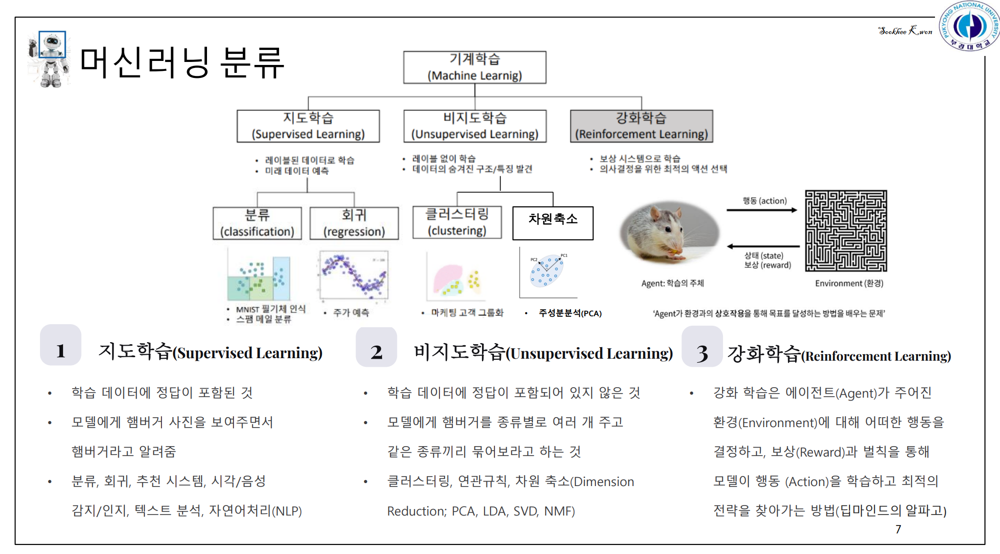

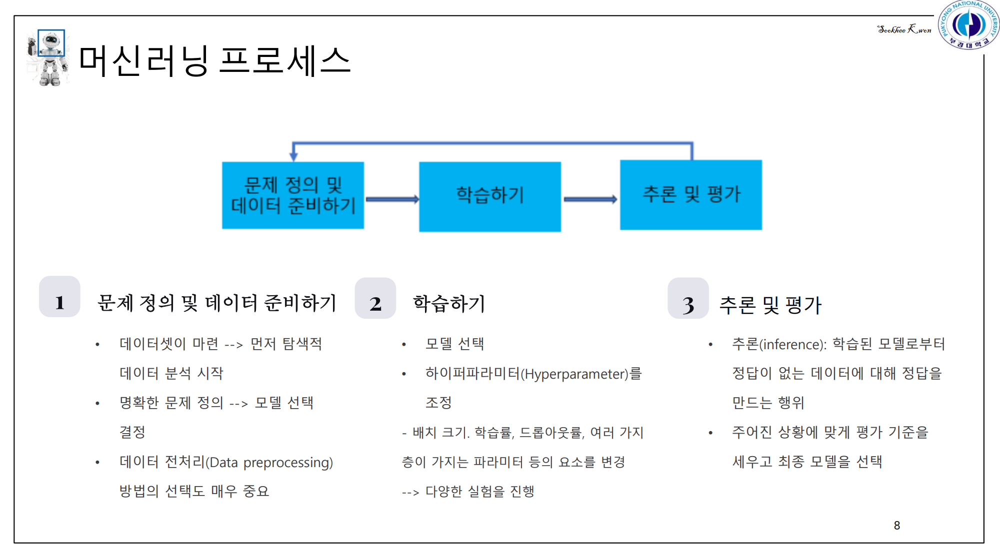

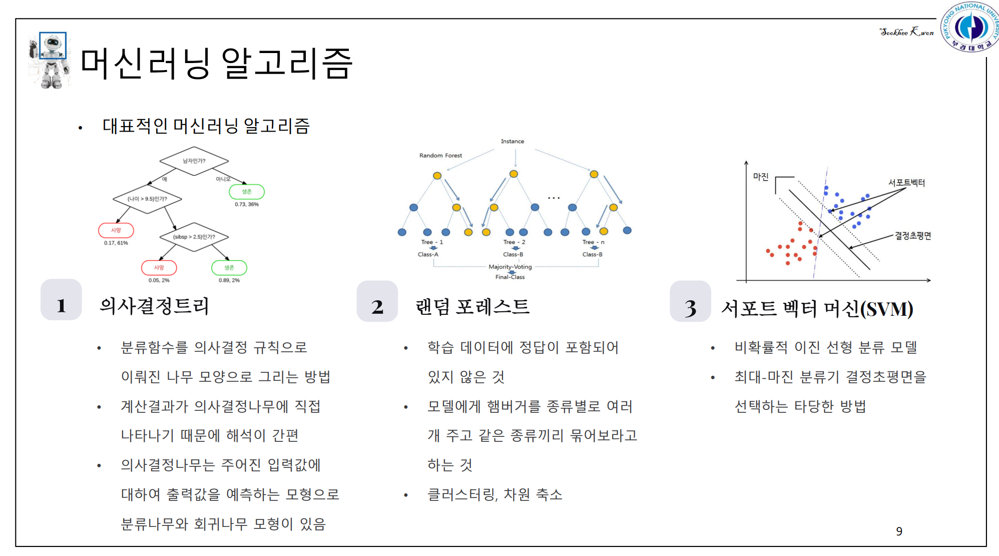

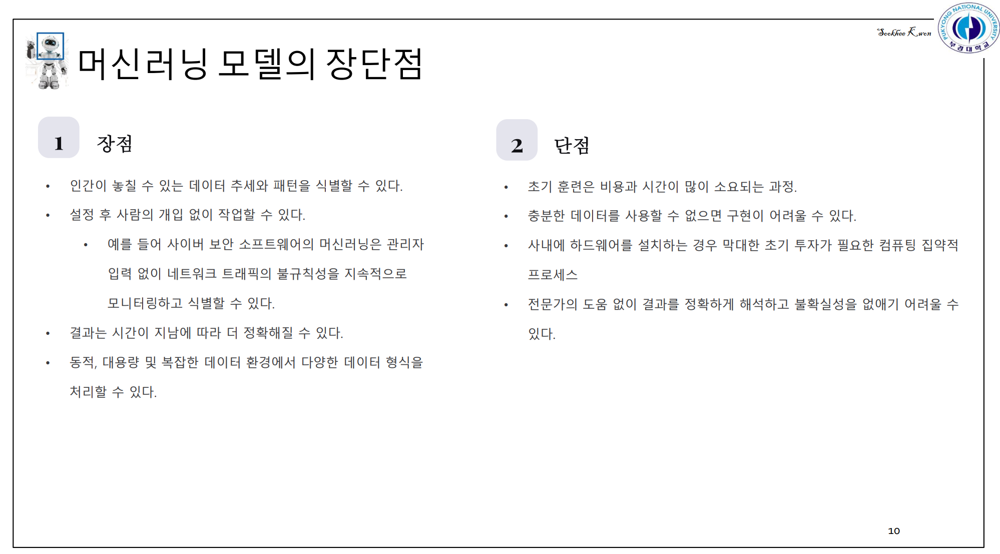

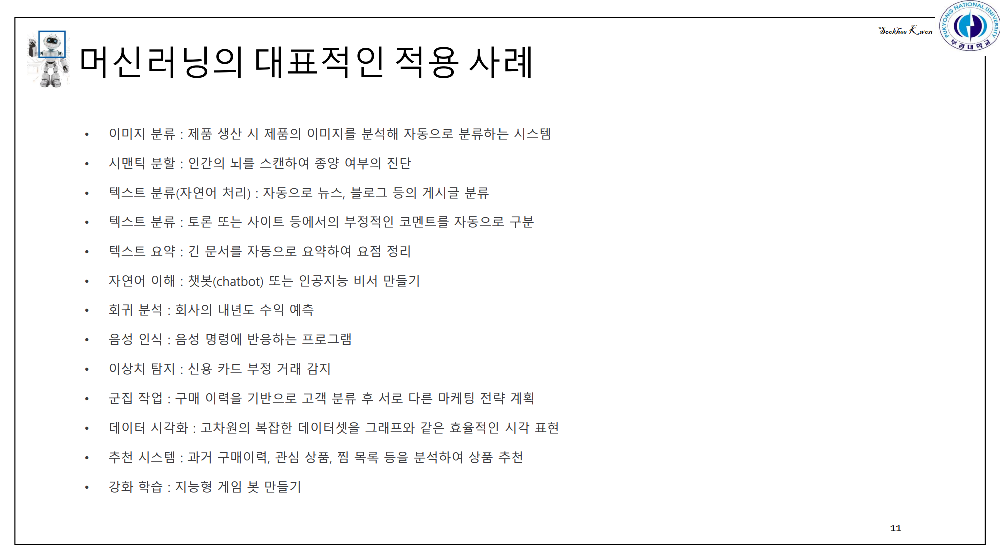

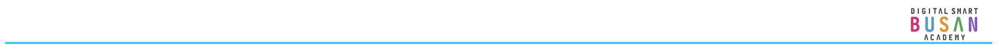

# 2장. 사이킷런(scikit-learn)으로 시작하는 머신러닝

* https://scikit-learn.org/stable/

# 01. 사이킷런 소개와 특징

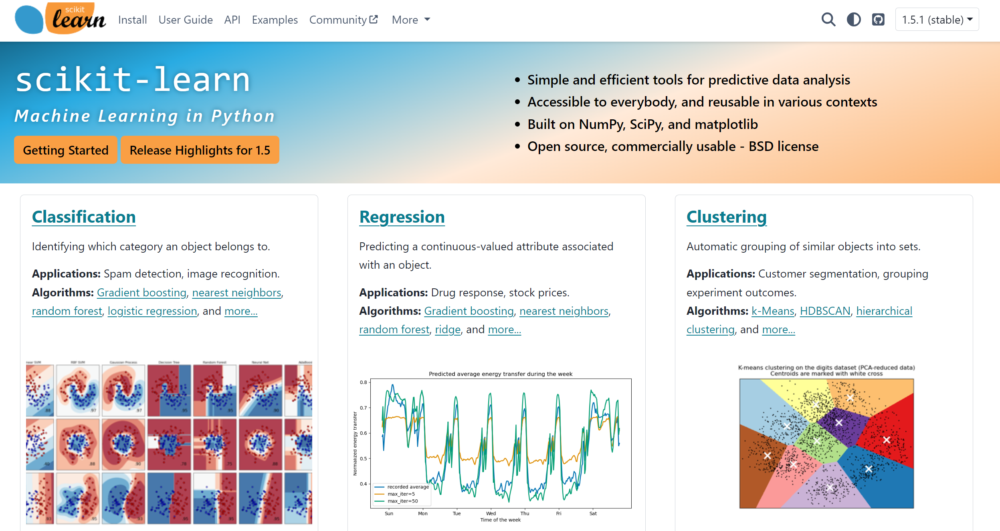

* 사이킷런의 특징
  * 파이썬 기반의 머신러닝 라이브러리 중 가장 많이 사용되는 라이브러리
  * 파이선 기반의 머신러닝을 위한 가장 쉽고 효율적인 개발 라이브러리를 제공
  * 파이썬 기반의 다른 머신러닝 패키지도 사이킷런 스타일의 API를 지향할 정도로 쉽고 가장 파이썬스러운 API를 제공
  * 머신러닝을 위한 매우 다양한 알고리즘과 개발을 위한 편리한 프레임워크와 API를 제공
  * 오랜 기간 실전 환경에서 검증됐으며, 매우 많은 환경에서 사용되는 성숙한 라이브러리


In [ ]:
# 원하는 버전을 설치하고자 할 때의 명령문
!pip install scikit-learn==1.0.2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.5/26.5 MB 39.7 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.2
    Uninstalling scikit-learn-1.3.2:
      Successfully uninstalled scikit-learn-1.3.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 1.13.0 requires scikit-learn>=1.2.2, but you have scikit-learn 1.0.2 which is incompatible.


In [ ]:
import sklearn
print(sklearn.__version__) # 참고) 앞뒤 언더스코어 연이어 두 개

1.0.2


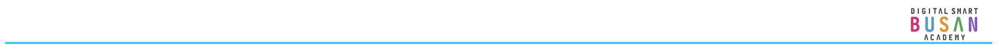

# 02 첫 번째 머신러닝 만들어 보기 - 붓꽃 품종 예측하기
* 붓꽃 데이터 세트로 붓꽃의 품종 분류하기
* 붓꽃 데이터 세트는 꽃잎의 길이와 너비, 꽃받침의 길이와 너비 피처(Feature)를 기반으로 꽃의 품종을 예측

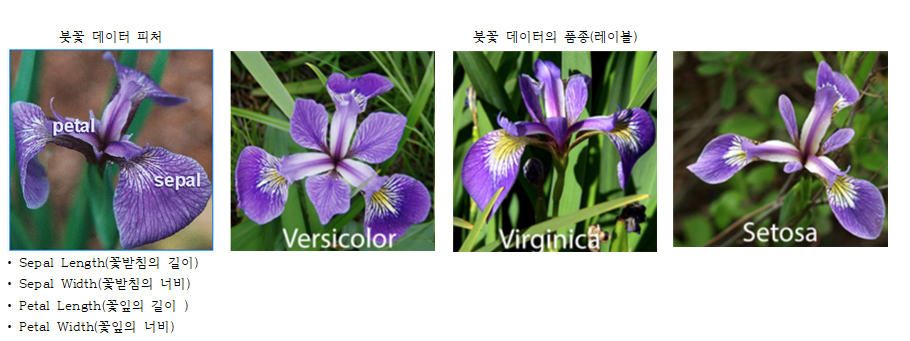

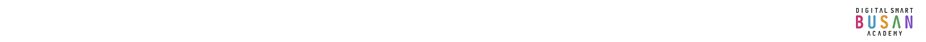



![[포맷변환]그림1 - 복사본.png](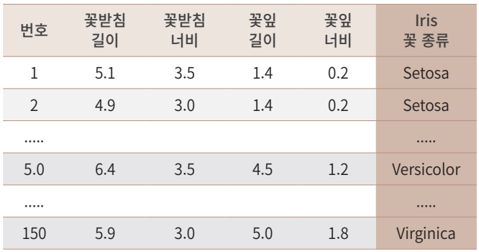)

* 분류(Classification)
   * 대표적인 지도학습(Supervised Learning) 방법
   * 지도학습: 학습을 위한 다양한 피처와 분류 결정값인 레이블(Label) 데이터로 모델을 학습한 뒤, 별도의 테스트 데이터 세트에서 미지의 레이블을 예측

In [ ]:
# 사이킷런에서 사용할 모듈을 임포트
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

* sklearn.datasets 내의 모듈은 사이킷런에서 자체적으로 제공하는 데이터 세트를 생성하는 모듈의 모임
* sklearn.tree내의 모듈은 트리 기반 ML 알고리즘을 구현한 클래스의 모임
* sklearn.model_selection은 학습 데이터와 검증 데이터, 예측 데이터로 데이터를 분리하거나 최적의 하이퍼 파라미터로 평가하기 위한 다양한 모듈의 모임

In [ ]:
import pandas as pd

# 붓꽃 데이터 세트를 로딩합니다.
iris = load_iris()

# iris.data는 Iris 데이터 세트에서 피처(feature)만으로 된 데이터를 numpy로 가지고 있습니다.
iris_data = iris.data

# iris.target은 붓꽃 데이터 세트에서 레이블(결정 값) 데이터를 numpy로 가지고 있습니다.
iris_label = iris.target
print('iris target값:', iris_label)          # 0= setosa, 1= versicolor, 2= virginica 품종
print('iris target명:', iris.target_names)

iris target값: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2]
iris target명: ['setosa' 'versicolor' 'virginica']


In [ ]:
# 붓꽃 데이터 세트를 자세히 보기 위해 DataFrame으로 변환합니다.
# 0= setosa, 1= versicolor, 2= virginica 품종
iris_df = pd.DataFrame(data=iris_data, columns=iris.feature_names)
iris_df['label'] = iris.target
iris_df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),label
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [ ]:
# 학습용 데이터와 테스트 데이터 분리
# train_test_split()의 인자 test_size=0.2는 학습용 데이터(80%)와 테스트용 데이터(20%)를 분리
# random_state는 호출할 때마다 같은 학습/테스트 용 데이터 세트를 생성하기 위해 주어지는 난수 발생값
X_train, X_test, y_train, y_test = train_test_split(iris_data, iris_label,
                                                    test_size=0.2, random_state=11)

In [ ]:
# DecisionTreeClassifier(의사 결정 트리클래스) 객체 생성
# random_state: 예제 코드를 수행할 때마다 동일한 학습/예측 결과를 출력하기 위한 용도로 사용
dt_clf = DecisionTreeClassifier(random_state=11)

# 학습 수행
dt_clf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=11)

In [ ]:
# 학습이 완료된 DecisionTreeClassifier 객체에서 테스트 데이터 세트로 예측 수행.
pred = dt_clf.predict(X_test)
pred

array([2, 2, 1, 1, 2, 0, 1, 0, 0, 1, 1, 1, 1, 2, 2, 0, 2, 1, 2, 2, 1, 0,
       0, 1, 0, 0, 2, 1, 0, 1])

In [ ]:
print(y_test)

[2 2 2 1 2 0 1 0 0 1 2 1 1 2 2 0 2 1 2 2 1 0 0 1 0 0 2 1 0 1]


In [ ]:
# 예측 결과를 기반으로 DecisionTreeClassifier의 예측 성능 평가(정확도; accuracy_score)
# 정확도: 예측 결과가 실제 레이블 값과 얼마나 정확하게 맞는지를 평가하는 지표
from sklearn.metrics import accuracy_score
print('예측 정확도: {0:.4f}'.format(accuracy_score(y_test,pred)))

예측 정확도: 0.9333


* **[붓꽃 데이터 세트로 분류를 예측한 프로세스]**
1. **데이터 세트 분리**: 데이터를 학습 데이터와 테스트 데이터로 분리
2. **모델 학습**: 학습 데이터를 기반으로 ML 알고리즘을 적용해 모델을 학습
3. **예측 수행**: 학습된 ML 모델을 이용해 테스트 데이터의 분류를 예측
4. **평가**: 예측된 결괏값과 테스트 데이터의 실제 결괏값을 비교해 ML 모델 성능을 평가





* **붓꽃 데이터 세트 기반의 ML분류 예측 수행 프로세스**
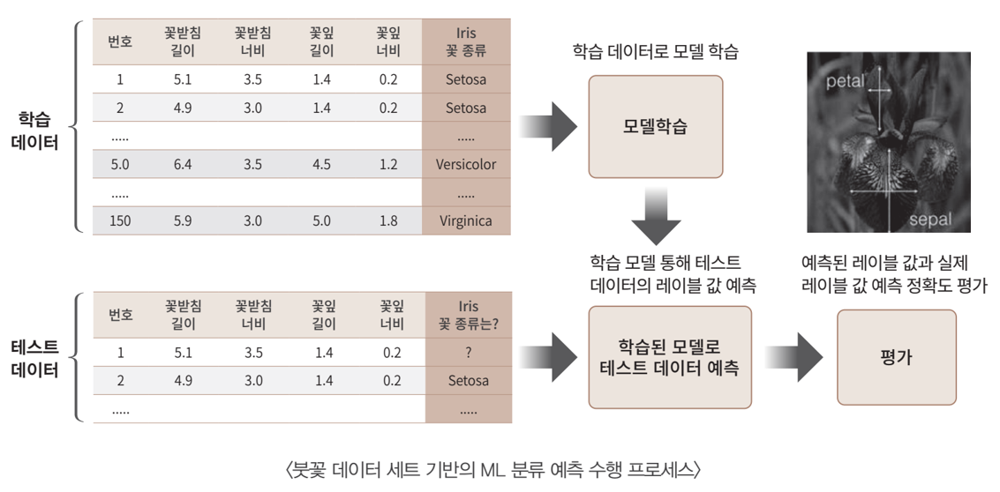

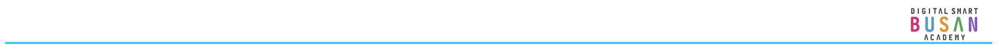

# 03 사이킷런의 기반 프레임워크 익히기
### **Estimator 이해 및 fit(), predict() 메서드**  
  * 사이킷런은 API 일관성과 개발 편의성을 제공하기 위한 노력이 엿보이는 패키지  
  * ML 모델 학습을 위해서 fit(), 학습된 모델의 예측을 위해 predict() 제공
  * 지도학습 - 분류(Calssification), 회귀(Regression) 알고리즘들에서 fit(), predict()로 학습과 예측 결과 반환
  * 사이킷런에서 분류 알고리즘을 구현한 클래스 - Classifier
  * 사이킷런에서 회귀 알고리즘을 구현한 클래스 - Regressor
  * Classifier, Regressor -> Estimator 클래스

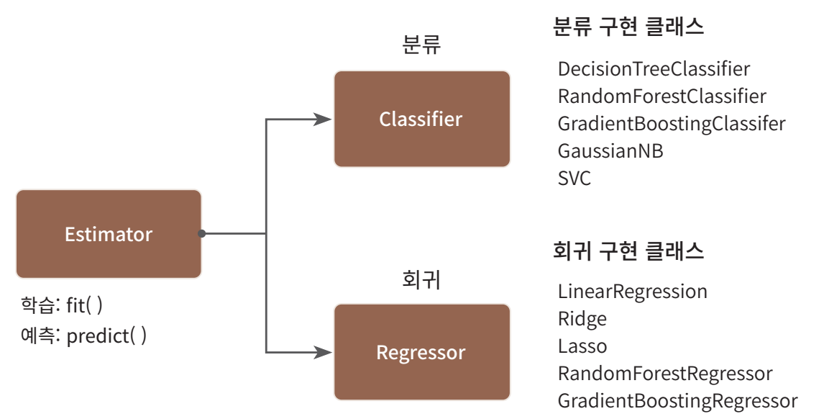

### 사이킷런의 주요 모듈





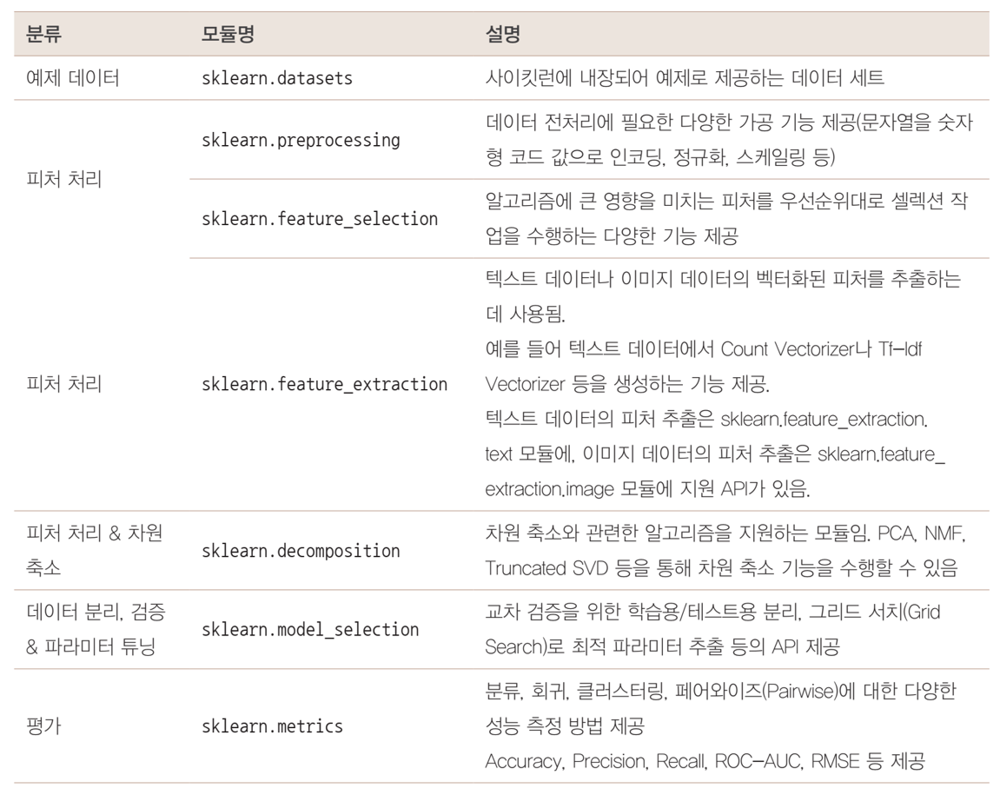
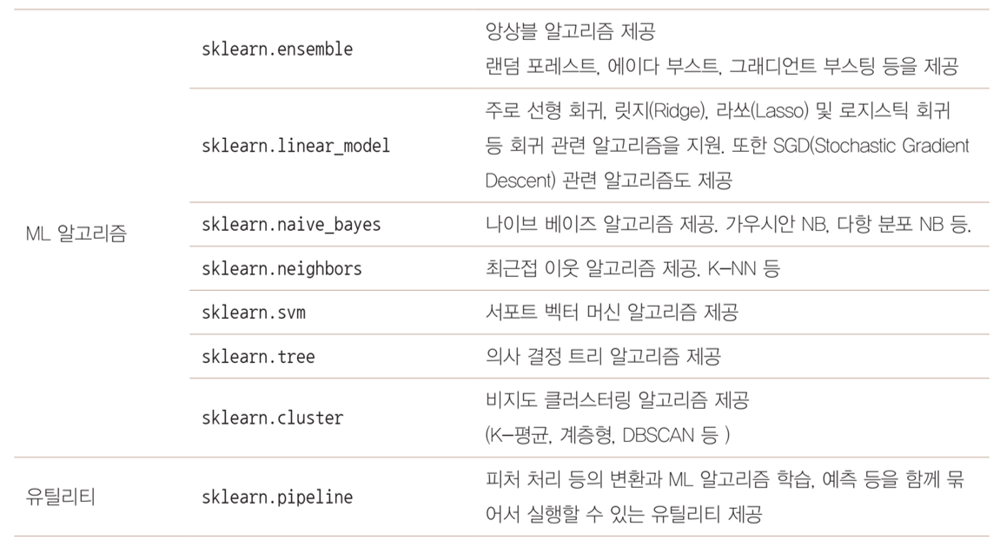

* **일반적으로 머신러닝 모델을 구축하는 주요 프로세스**
  * 피처의 가공, 변경, 추출을 수행하는 피처 처리(feature processing)  
  * ML 알고리즘 학습/예측 수행
  * 모델 평가

### **내장된 예제 데이터 세트**  
   * 사이킷런에는 별도의 외부 웹사이트에서 데이터 세트를 내려받을 필요 없이 예제로 활용할 수 있는 데이터 세트 내장
   
  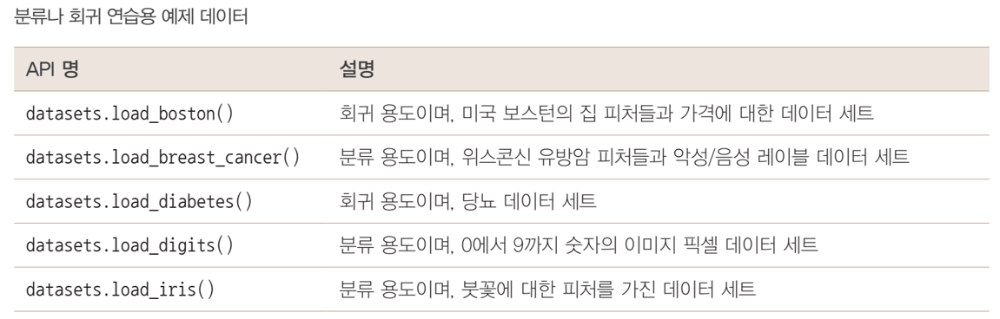

* fetch 계열의 명령 데이터  
   * 데이터 크기가 커서 패키지에 처음부터 저장돼 있지 않고 인터넷에서 내려받아야 함
   * 홈 디렉터리 아래의 scikit_learn_data 라는 서브 디렉터리에 저장한 후 추후 불러들이는 데이터
    * fetch_covtype(): 회귀 분석용 토지 조사 자료
    * fetch_20newsgroups(): 뉴스 그룹 텍스트 자료
    * fetch_olivetti_faces(): 얼굴 이미지 자료
    * fetch_lfw_people(): 얼굴 이미지 자료
    * fetch_1fw_pairs(): 얼굴 이미지 자료
    * fetch_rcv1(): 로이터 뉴스 말뭉치
    * fetch_mldata(): ML 웹사이트에서 다운로드

* 표본 데이터 생성기
  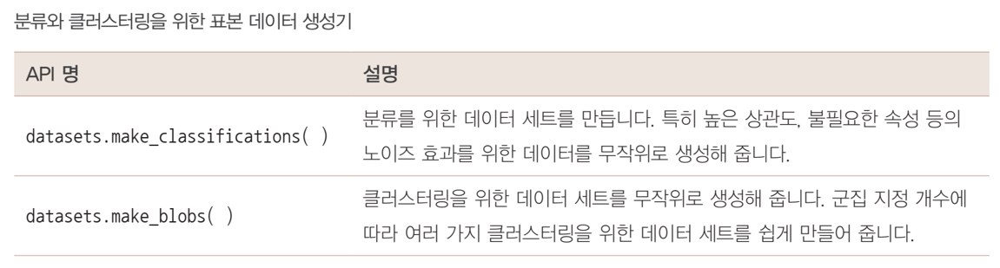

* 예제 데이터 구성  
   * 딕셔너리 형태
   * 키: data, target, target_name, feature_names, DESCR
   * data: 피처의 데이터 세트를 가리킵니다.(ndarray)
   * target: 분류 시 레이블 값, 회귀일 때는 숫자 결괏값 데이터 세트입니다.(ndarray or list)
   * target_names: 개별 레이블의 이름을 나타냅니다.
   * feature_names: 피처의 이름을 나타냅니다.
   * DESCR: 데이터 세트에 대한 설명과 각 피처의 설명을 나타냅니다.(스트링)

In [ ]:
# 붓꽃 데이터 예제
from sklearn.datasets import load_iris

iris_data = load_iris()
print(type(iris_data))

<class 'sklearn.utils.Bunch'>


In [ ]:
keys = iris_data.keys()
print('붓꽃 데이터 세트의 키들:', keys)

붓꽃 데이터 세트의 키들: dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])


* load_iris() 가 반환하는 붓꽃 데이터 세트의 각 키가 의미하는 값을 표시

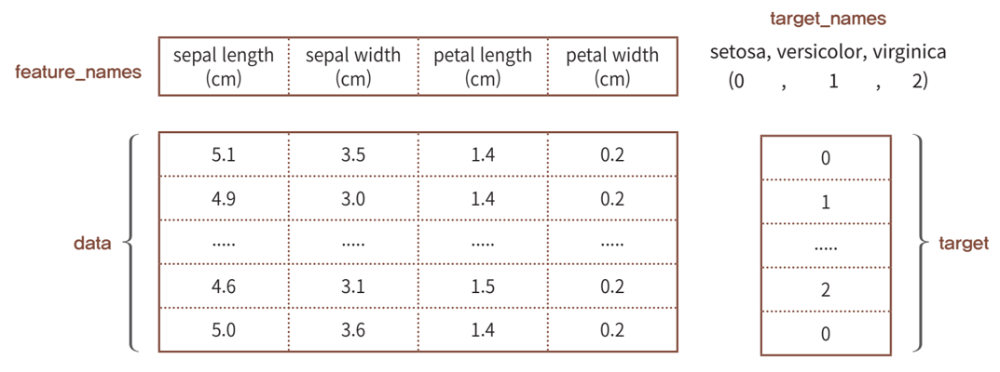

* load_iris() 가 반환하는 객체의 키들이 가리키는 값을 출력

In [ ]:
print('\n feature_names 의 type:',type(iris_data.feature_names))


 feature_names 의 type: <class 'list'>


In [ ]:
print(' feature_names 의 shape:',len(iris_data.feature_names))

 feature_names 의 shape: 4


In [ ]:
print(iris_data.feature_names)

['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']


In [ ]:
print('\n target_names 의 type:',type(iris_data.target_names))


 target_names 의 type: <class 'numpy.ndarray'>


In [ ]:
print(' feature_names 의 shape:',len(iris_data.target_names))

 feature_names 의 shape: 3


In [ ]:
print(iris_data.target_names)

['setosa' 'versicolor' 'virginica']


In [ ]:
print('\n data 의 type:',type(iris_data.data))


 data 의 type: <class 'numpy.ndarray'>


In [ ]:
print(' data 의 shape:',iris_data.data.shape)

 data 의 shape: (150, 4)


In [ ]:
print(iris_data['data'])

[[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]
 [5.4 3.9 1.7 0.4]
 [4.6 3.4 1.4 0.3]
 [5.  3.4 1.5 0.2]
 [4.4 2.9 1.4 0.2]
 [4.9 3.1 1.5 0.1]
 [5.4 3.7 1.5 0.2]
 [4.8 3.4 1.6 0.2]
 [4.8 3.  1.4 0.1]
 [4.3 3.  1.1 0.1]
 [5.8 4.  1.2 0.2]
 [5.7 4.4 1.5 0.4]
 [5.4 3.9 1.3 0.4]
 [5.1 3.5 1.4 0.3]
 [5.7 3.8 1.7 0.3]
 [5.1 3.8 1.5 0.3]
 [5.4 3.4 1.7 0.2]
 [5.1 3.7 1.5 0.4]
 [4.6 3.6 1.  0.2]
 [5.1 3.3 1.7 0.5]
 [4.8 3.4 1.9 0.2]
 [5.  3.  1.6 0.2]
 [5.  3.4 1.6 0.4]
 [5.2 3.5 1.5 0.2]
 [5.2 3.4 1.4 0.2]
 [4.7 3.2 1.6 0.2]
 [4.8 3.1 1.6 0.2]
 [5.4 3.4 1.5 0.4]
 [5.2 4.1 1.5 0.1]
 [5.5 4.2 1.4 0.2]
 [4.9 3.1 1.5 0.2]
 [5.  3.2 1.2 0.2]
 [5.5 3.5 1.3 0.2]
 [4.9 3.6 1.4 0.1]
 [4.4 3.  1.3 0.2]
 [5.1 3.4 1.5 0.2]
 [5.  3.5 1.3 0.3]
 [4.5 2.3 1.3 0.3]
 [4.4 3.2 1.3 0.2]
 [5.  3.5 1.6 0.6]
 [5.1 3.8 1.9 0.4]
 [4.8 3.  1.4 0.3]
 [5.1 3.8 1.6 0.2]
 [4.6 3.2 1.4 0.2]
 [5.3 3.7 1.5 0.2]
 [5.  3.3 1.4 0.2]
 [7.  3.2 4.7 1.4]
 [6.4 3.2 4.5 1.5]
 [6.9 3.1 4.

In [ ]:
print('\n target 의 type:',type(iris_data.target))


 target 의 type: <class 'numpy.ndarray'>


In [ ]:
print(' target 의 shape:',iris_data.target.shape)

 target 의 shape: (150,)


In [ ]:
print(iris_data.target)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2]


In [ ]:
print(iris_data.DESCR)

.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

    :Number of Instances: 150 (50 in each of three classes)
    :Number of Attributes: 4 numeric, predictive attributes and the class
    :Attribute Information:
        - sepal length in cm
        - sepal width in cm
        - petal length in cm
        - petal width in cm
        - class:
                - Iris-Setosa
                - Iris-Versicolour
                - Iris-Virginica
                
    :Summary Statistics:

    ============== ==== ==== ======= ===== ====================
                    Min  Max   Mean    SD   Class Correlation
    ============== ==== ==== ======= ===== ====================
    sepal length:   4.3  7.9   5.84   0.83    0.7826
    sepal width:    2.0  4.4   3.05   0.43   -0.4194
    petal length:   1.0  6.9   3.76   1.76    0.9490  (high!)
    petal width:    0.1  2.5   1.20   0.76    0.9565  (high!)
    ============== ==== ==== ======= ===== ===========

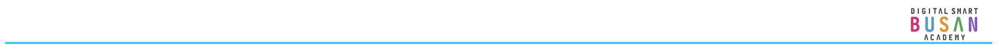

# 04 Model Selection 모듈 소개
: 학습 데이터와 테스트 데이터 세트를 분리, 교차 검증 분할 및 평가, Estimator의 하이퍼 파라미터를 튜닝하기 위한 다양한 함수와 클래스 제공

### 학습/테스트 데이터 세트 분리 - train_test_split()  
   * 학습과 예측을 동일한 데이터 세트로 수행한 결과
     * 문제점은?

In [ ]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

iris = load_iris()
dt_clf = DecisionTreeClassifier()
train_data = iris.data
train_label = iris.target
dt_clf.fit(train_data, train_label)

# 학습 데이터 셋으로 예측 수행
pred = dt_clf.predict(train_data)
print('예측 정확도:',accuracy_score(train_label,pred))

예측 정확도: 1.0


* 예측 결과가 100% 인 이유는 이미 학습한 학습 데이터 세트를 기반으로 예측했기 때문
* 즉, 모의고사를 이미 한 번 보고 답을 알고 있는 상태에서 모의고사 문제와 똑같은 본고사 문제가 출제됐기 때문
* 따라서 예측을 수행하는 데이터 세트는 학습을 수행한 학습용 데이터 세트가 아닌 전용의 테스트 데이터 세트여야

* 학습 및 테스트 데이터 세트로 분리 필요

* sklearn.model_selection모듈의 train_test_split()함수  
   * test_size: 전체 데이터에서 테스트 데이터 세트 크기를 얼마로 샘플링할 것인가를 결정함. 디폴트는 0.25, 즉 25%.
   * train_size: 전체 데이터에서 학습용 데이터 세트 크기를 얼마로 샘플링할  것인가를 결정함. test_size parameter를 통상적으로 사용하기 때문에 train_size는 잘 사용되지 않음.
   * shuffle: 데이터를 분리하기 전에 데이터를 미리 섞을지를 결정함. 디폴트는 True. 데이터를 분산시켜서 좀 더 효율적인 학습 및 테스트 데이터 세트를 만드는데 사용됨.
   * random_state: random_state는 호출할 때마다 동일한 학습/테스트용 데이터 세트를 생성하기 위해 주어지는 난수 값.
   * train_test_split()의 반환값은 튜플 형태임. 순차적으로 학습용 데이터의 피처 데이터 세트, 테스트용 데이터의 피처 데이터 세트, 학습용 데이터의 레이블 데이터 세트, 테스트용 데이터의 레이블 데이터 세트가 반환됨.

In [ ]:
# 붓꽃 데이터 세트를 train_test_split() 를 이용해 테스트 데이터 세트를 전체의 30%로, 학습 데이터 세트를 70%로 분리
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split

dt_clf = DecisionTreeClassifier( )
iris_data = load_iris()

X_train, X_test, y_train, y_test = train_test_split(iris_data.data, iris_data.target,
                                                    test_size=0.3, random_state=121)

In [ ]:
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict(X_test)
print('예측 정확도: {0:.4f}'.format(accuracy_score(y_test,pred)))

예측 정확도: 0.9556


* 해당 데이터 및 분석 결과에서의 문제점은?
  * 붓꽃 데이터는 데이터 양이 크지 않으므로(30% 정도인 테스트 데이터는 45개) 이를 통해 알고리즘의 예측 성능을 판단하기에는 그리 적절하지 않다.

  * 학습을 위한 데이터의 양을 일정 수준이상으로 보장하는 것도 중요하지만, 학습된 모델에 대해 다양한 데이터를 기반으로 예측 성능을 평가해보는 것도 매우 중요

### **교차 검증(Cross Validation)**  
 * 고정된 학습 데이터와 테스트 데이터 -> 과적합에 취약
 * 과적합(overfitting): 모델이 학습 데이터에만 과도하게 최적화되어, 실제 예측을 다른 데이터로 수행할 경우에는 예측 성능이 과도하게 떨어지는 것을 뜻함
 * 해당 문제점을 해결하기 위한 방법은?
   * 데이터 편중을 막기 위해 교차 검증 수행




* 교차검증이란?
  * 데이터 편중을 막기 위해서 별도의 여러 세트로 구성된 학습 데이터 세트와 검증 데이터 세트에서 학습과 평가를 수행
  * ML 에 사용되는 데이터 세트를 세분화해서 학습, 검증, 테스트 데이터 세트로 나눔

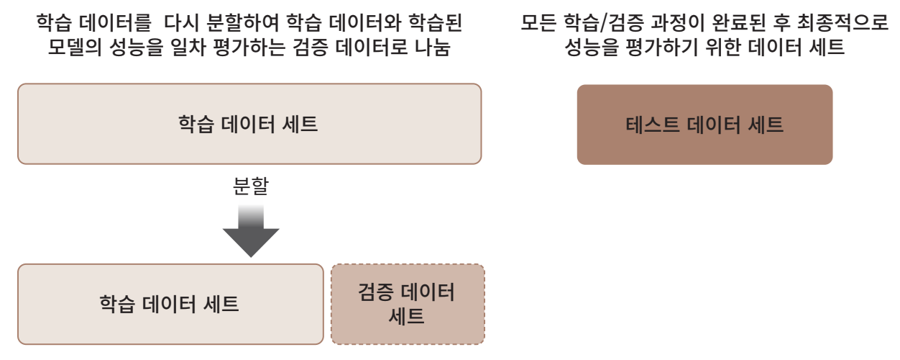

* **K폴드 교차 검증(k-fold Cross Validation)**  
   * 가장 보편적으로 사용되는 교차 검증 기법
   * K개의 데이터 폴드 세트를 만들어서 K번만큼 각 폴트 세트에 학습과 검증 평가를 반복적으로 수행하는 방법
   * 사이킷런에서는 K 폴드 교차 검증 프로세스 를 구현하기 위해 KFold 와 StratifiedKFold 클래스를 제공

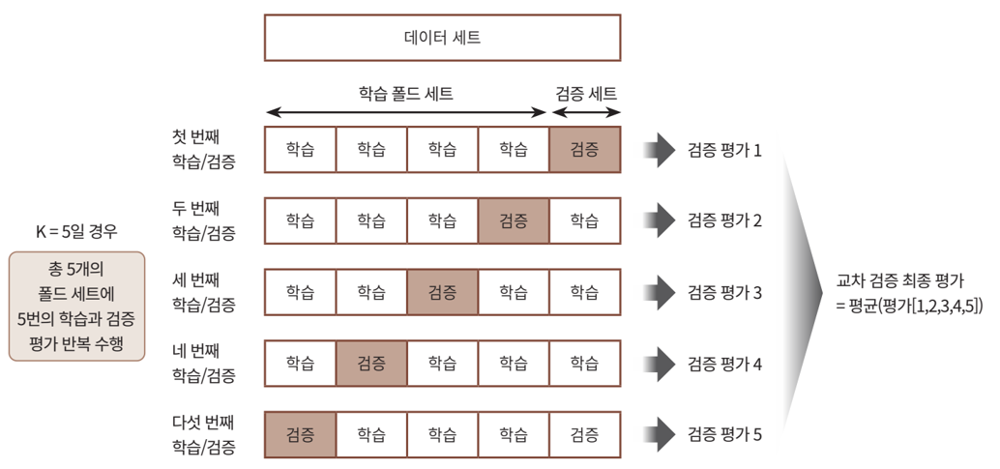

In [ ]:
# 먼저 KFold 클래스를 이용해 5개의 폴드 세트로 분리하는 KFold 객체를 생성
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
import numpy as np

iris = load_iris()
features = iris.data
label = iris.target
dt_clf = DecisionTreeClassifier(random_state=156)

# 5개의 폴드 세트로 분리하는 KFold 객체와 폴드 세트별 정확도를 담을 리스트 객체 생성.
kfold = KFold(n_splits=5)
cv_accuracy = []
print('붓꽃 데이터 세트 크기:',features.shape[0])

붓꽃 데이터 세트 크기: 150


* KFold 객체 생성 후, 생성된 KFold 객체의 split()을 호출해 전체 붓꽃 데이터를 5개의 폴드 데이터 세트로 분리
  * 학습용 데이터 세트와 검증 테스트 데이터 세트는 각각 몇 개씩으로 분할?

  
* 5개의 폴드 세트를 생성하는 KFold 객체의 split()을 호출해 교차 검증 수행 시마다 학습과 검증을 반복해 예측 정확도를 측정


In [ ]:
n_iter = 0

# KFold객체의 split( ) 호출하면 폴드 별 학습용, 검증용 테스트의 로우 인덱스를 array로 반환
for train_index, test_index  in kfold.split(features):
    # kfold.split( )으로 반환된 인덱스를 이용하여 학습용, 검증용 테스트 데이터 추출
    X_train, X_test = features[train_index], features[test_index]
    y_train, y_test = label[train_index], label[test_index]
    #학습 및 예측
    dt_clf.fit(X_train , y_train)
    pred = dt_clf.predict(X_test)
    n_iter += 1
    # 반복 시 마다 정확도 측정
    accuracy = np.round(accuracy_score(y_test,pred), 4)
    train_size = X_train.shape[0]
    test_size = X_test.shape[0]
    print('\n#{0} 교차 검증 정확도 :{1}, 학습 데이터 크기: {2}, 검증 데이터 크기: {3}'
          .format(n_iter, accuracy, train_size, test_size))
    print('#{0} 검증 세트 인덱스:{1}'.format(n_iter,test_index))
    cv_accuracy.append(accuracy)

# 개별 iteration별 정확도를 합하여 평균 정확도 계산
print('\n## 평균 검증 정확도:', np.mean(cv_accuracy))


#1 교차 검증 정확도 :1.0, 학습 데이터 크기: 120, 검증 데이터 크기: 30
#1 검증 세트 인덱스:[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]

#2 교차 검증 정확도 :0.9667, 학습 데이터 크기: 120, 검증 데이터 크기: 30
#2 검증 세트 인덱스:[30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53
 54 55 56 57 58 59]

#3 교차 검증 정확도 :0.8667, 학습 데이터 크기: 120, 검증 데이터 크기: 30
#3 검증 세트 인덱스:[60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83
 84 85 86 87 88 89]

#4 교차 검증 정확도 :0.9333, 학습 데이터 크기: 120, 검증 데이터 크기: 30
#4 검증 세트 인덱스:[ 90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119]

#5 교차 검증 정확도 :0.7333, 학습 데이터 크기: 120, 검증 데이터 크기: 30
#5 검증 세트 인덱스:[120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137
 138 139 140 141 142 143 144 145 146 147 148 149]

## 평균 검증 정확도: 0.9


* 데이터가 불균형일 때에는?

* **Stratified K 폴드**  
   * 불균형한(imbalanced) 분포도를 가진 레이블(결정 클래스) 데이터 집합을 위한 K 폴드 방식
   * 불균형한 분포도를 가진 레이블 데이터 집합: 특정 레이블 값이 특이하게 많거나 매우 적어서 값의 분포가 한쪽으로 치우치는 것을 뜻함
   * Ex) 대출 사기 데이터  
   : 대부분의 데이터는 정상 대출  
     원본 데이터와 유사한 대출 사기 레이블 값의 분포를 학습/테스트 세트에도 유지하는 게 매우 중요
   * 따라서 K폴드가 레이블 데이터 집합이 원본 데이터 집합의 레이블 분포를 학습 및 테스트 세트에 제대로 분배하지 못하는 경우의 문제를 해결

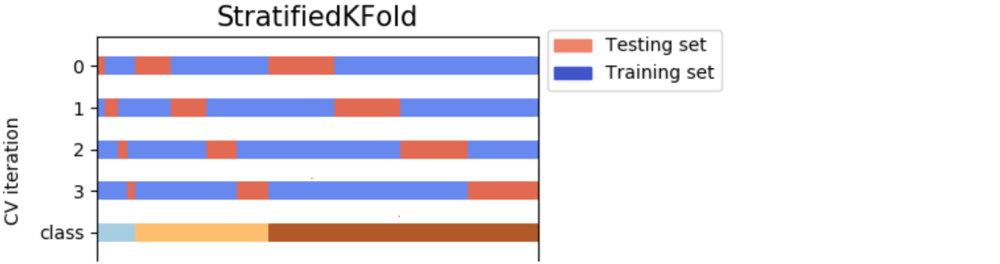   

* K 폴드가 갖고 있는 문제 예시

In [ ]:
import pandas as pd

iris = load_iris()

iris_df = pd.DataFrame(data=iris.data, columns=iris.feature_names)
iris_df['label']=iris.target
iris_df['label'].value_counts()

,count
label,
0,50
1,50
2,50


In [ ]:
kfold = KFold(n_splits=3)
# kfold.split(X)는 폴드 세트를 3번 반복할 때마다 달라지는 학습/테스트 용 데이터 로우 인덱스 번호 반환.
n_iter =0
for train_index, test_index  in kfold.split(iris_df):
    n_iter += 1
    label_train= iris_df['label'].iloc[train_index]
    label_test= iris_df['label'].iloc[test_index]
    print('## 교차 검증: {0}'.format(n_iter))
    print('학습 레이블 데이터 분포:\n', label_train.value_counts())
    print('검증 레이블 데이터 분포:\n', label_test.value_counts())

## 교차 검증: 1
학습 레이블 데이터 분포:
 label
1    50
2    50
Name: count, dtype: int64
검증 레이블 데이터 분포:
 label
0    50
Name: count, dtype: int64
## 교차 검증: 2
학습 레이블 데이터 분포:
 label
0    50
2    50
Name: count, dtype: int64
검증 레이블 데이터 분포:
 label
1    50
Name: count, dtype: int64
## 교차 검증: 3
학습 레이블 데이터 분포:
 label
0    50
1    50
Name: count, dtype: int64
검증 레이블 데이터 분포:
 label
2    50
Name: count, dtype: int64


* 위에서 각 교차 검증 시 생성된 데이터에서의 문제점은?
  * 교차 검증 시마다 3개의 폴드 세트로 만들어지는 학습 레이블과 검증 레이블이 완전히 다른 값으로 추출
    * 예를 들어 첫 번째 교차 검증에서는
      * 학습 레이블의 1, 2 값이 각각 50개가 추출되었고, 검증 레이블의 0값이 50개 추출되었다.
      * 학습 레이블은 1, 2밖에 없으므로 0의 경우는 전혀 학습하지 못한다.
      * 반대로 검증 레이블은 0밖에 없으므로 학습 모델은 절대 0을 예측하지 못한다.
      * 이런 유형으로 교차 검증 데이터 세트를 분할하면 검증 예측 정확도는 0이 될 수밖에 없다.

* **StratifiedKFold로 수행 후 학습/검증 레이블 데이터의 분포도 확인**

In [ ]:
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=3)
n_iter=0

for train_index, test_index in skf.split(iris_df, iris_df['label']):
    n_iter += 1
    label_train= iris_df['label'].iloc[train_index]
    label_test= iris_df['label'].iloc[test_index]
    print('## 교차 검증: {0}'.format(n_iter))
    print('학습 레이블 데이터 분포:\n', label_train.value_counts())
    print('검증 레이블 데이터 분포:\n', label_test.value_counts())

## 교차 검증: 1
학습 레이블 데이터 분포:
 label
2    34
0    33
1    33
Name: count, dtype: int64
검증 레이블 데이터 분포:
 label
0    17
1    17
2    16
Name: count, dtype: int64
## 교차 검증: 2
학습 레이블 데이터 분포:
 label
1    34
0    33
2    33
Name: count, dtype: int64
검증 레이블 데이터 분포:
 label
0    17
2    17
1    16
Name: count, dtype: int64
## 교차 검증: 3
학습 레이블 데이터 분포:
 label
0    34
1    33
2    33
Name: count, dtype: int64
검증 레이블 데이터 분포:
 label
1    17
2    17
0    16
Name: count, dtype: int64


* 출력 결과, 학습 레이블과 검증 레이블 데이터 값의 분포도가 거의 동일하게 할당됐음을 알 수 있다.
  * 이렇게 분할이 되어야 레이블 값 0, 1, 2 를 모두 학습할 수 있고, 이에 기반해 검증을 수행할 수 있다.

* **StratifiedKFold를 이용해 데이터 분리**  
   

In [ ]:
# StratifiedKFold를 이용해 붓꽃 데이터를 교차 검증
dt_clf = DecisionTreeClassifier(random_state=156)

skfold = StratifiedKFold(n_splits=3)
n_iter=0
cv_accuracy=[]

# StratifiedKFold의 split( ) 호출시 반드시 레이블 데이터 셋도 추가 입력 필요
for train_index, test_index  in skfold.split(features, label):
    # split( )으로 반환된 인덱스를 이용하여 학습용, 검증용 테스트 데이터 추출
    X_train, X_test = features[train_index], features[test_index]
    y_train, y_test = label[train_index], label[test_index]
    #학습 및 예측
    dt_clf.fit(X_train , y_train)
    pred = dt_clf.predict(X_test)

    # 반복 시 마다 정확도 측정
    n_iter += 1
    accuracy = np.round(accuracy_score(y_test,pred), 4)
    train_size = X_train.shape[0]
    test_size = X_test.shape[0]
    print('\n#{0} 교차 검증 정확도 :{1}, 학습 데이터 크기: {2}, 검증 데이터 크기: {3}'
          .format(n_iter, accuracy, train_size, test_size))
    print('#{0} 검증 세트 인덱스:{1}'.format(n_iter,test_index))
    cv_accuracy.append(accuracy)

# 교차 검증별 정확도 및 평균 정확도 계산
print('\n## 교차 검증별 정확도:', np.round(cv_accuracy, 4))
print('## 평균 검증 정확도:', np.round(np.mean(cv_accuracy), 4))


#1 교차 검증 정확도 :0.98, 학습 데이터 크기: 100, 검증 데이터 크기: 50
#1 검증 세트 인덱스:[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  50
  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66 100 101
 102 103 104 105 106 107 108 109 110 111 112 113 114 115]

#2 교차 검증 정확도 :0.94, 학습 데이터 크기: 100, 검증 데이터 크기: 50
#2 검증 세트 인덱스:[ 17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  67
  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82 116 117 118
 119 120 121 122 123 124 125 126 127 128 129 130 131 132]

#3 교차 검증 정확도 :0.98, 학습 데이터 크기: 100, 검증 데이터 크기: 50
#3 검증 세트 인덱스:[ 34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  83  84
  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 133 134 135
 136 137 138 139 140 141 142 143 144 145 146 147 148 149]

## 교차 검증별 정확도: [0.98 0.94 0.98]
## 평균 검증 정확도: 0.9667


* 일반적으로 분류(Classification) 에서의 교차 검증은 Stratified K 폴드로 분할
* 회귀(Regression) 에서는 Stratified K 폴드가 지원되지 않는다.
  * 이유는 간단. 회귀의 결정값은 이산값 형태의 레이블이 아니라 연속된 숫자값이기 때문에 결정값별로 분포를 정하는 의미가 없기 때문

* **교차 검증을 보다 간편하게 - cross_val_score( )**  
  * 사이킷런에서 교차 검증을 좀 더 편리하게 수행할 수 있게 해주는 API  
  : cross_val_score()
  * KFold로 데이터 학습하고 예측하는 일련의 과정을 한꺼번에 수행해주는 API
    
  * cross_val_score(estimator , X , y , scoring=None,cv=None)  
   estimator: 분류 Classifier / 예측 Regressor  
   X: 피처 데이터 세트  
   y: 레이블 데이터 세트  
   scoreing: 예측 성능 평가 지표를 기술  
   cv: 교차 검증 폴드 수  
  * clssifier가 입력되면 Stratified K 폴드 방식으로 레이블값의 분포에 따라 학습/테스트 세트 분할 (회귀인 경우는 Stratified K 폴드 방식으로 분할할 수 없으므로 K 폴드 방식으로 분할)




In [ ]:
# 교차 검증 폴드 수는 3, 성능 평가 지표는 정확도인 accuracy
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score , cross_validate
from sklearn.datasets import load_iris

iris_data = load_iris()
dt_clf = DecisionTreeClassifier(random_state=156)

data = iris_data.data
label = iris_data.target

# 성능 지표는 정확도(accuracy) , 교차 검증 세트는 3개
scores = cross_val_score(dt_clf , data , label , scoring='accuracy',cv=3)
print('교차 검증별 정확도:',np.round(scores, 4))
print('평균 검증 정확도:', np.round(np.mean(scores), 4))

교차 검증별 정확도: [0.98 0.94 0.98]
평균 검증 정확도: 0.9667


* cross_val_score() 는 cv로 지정된 횟수만큼 scoring 파라미터로 지정된 평가 지표로 평가 결값을 배열로 반환
  * 해당 API는 내부에서 Estimator 를 학습(fit), 예측(predict), 평가(evaluation)시켜주므로 간단하게 교차검증을 수행할 수 있다.

* 또한 내부적으로 StratifiedKFold를 이용하기 때문에 StratifiedKFold의 수행 결과와 비교했을때 각 교차 검증별 정확도와 평균 검증 정확도가 모두 동일함을 알 수 있다.

* 비슷한 API로 cross_validate() 가 있다.
  * cross_val_score() 는 단 하나의 평가 지표만 가능하지만 cross_validate()는 여러 개의 평가 지표를 반환할 수 있으며, 학습 데이터에 대한 성능 평가 지표와 수행 시간도 같이 제공

### **GridSearchCV - 교차 검증과 최적 하이퍼 파라미터 튜닝을 한 번에**
* 사이킷런에서 GridSearchCV API를 이용해 최적의 하이퍼파라미터 도출할 수 있는 방안을 제공함
  
* 하이퍼파라미터: 머신러닝 알고리즘을 구성하는 주요 구성 요소, 이 값을 조정해 알고리즘의 예측 성능을 개선할 수 있음
* GridSearch: 촘촘하게 파라미터를 입력하면서 테스트 하는 방식 (Grid: 격자)

* 모든 파라미터를 번갈아가면서 학습
* 단점) 수행시간이 상대적으로 오래 걸림

In [ ]:
# 예를 들어 결정 트리 알고리즘의 여러 하이퍼 파라미터를 순차적으로 변경하면서 최고 성능을 가지는 파라미터 조합을 찾고자 한다면
# 다음과 같이 파라미터의 집합을 만들고 이를 순차적으로 적용하면서 최적화를 수행할 수 있다.
grid_parameters = {'max_depth':[1,2,3],
                   'min_samples_split':[2,3]
                   }

* 위의 경우, 실험 횟수는?
  * 하이퍼 파라미터는 다음과 같이 순차적으로 적용, 총 6회에 걸쳐 파라미터를 순차적으로 바꿔 실행하면서 최적의 파라미터와 수행 결과를 도출할 수 있다.

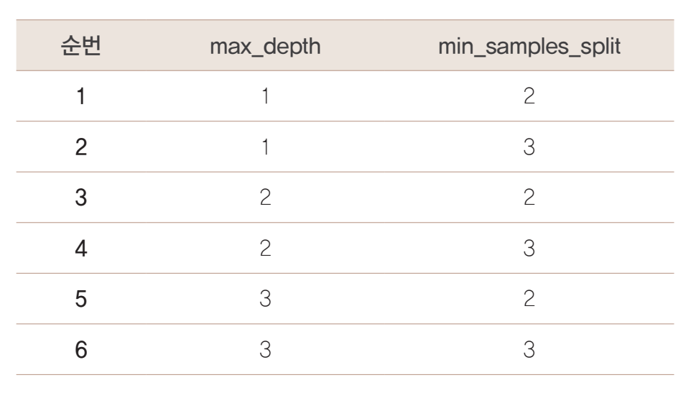

* GridSearchCV: 교차 검증을 기반으로 이 하이퍼 파라미터의 최적 값을 찾게 해줌
  * 위의 경우 순차적으로 6회에 걸쳐 하이퍼 파라미터를 변경하면서 교차 검증 데이터 세트에 수행 성능을 측정
  * CV가 3회라면 개별 파라미터 조합마다 3개의 폴딩 세트를 3회에 걸쳐 학습/평가해 평균값으로 성능을 측정
  * 6개의 파라미터 조합이라면 총 CV 3회 X 6개 파라미터 조합 = 18회의 학습/평가가 이뤄진다.

* GridSearchCV 클래스의 생성자로 들어가는 주요 파라미터
  * estimator: classifier, regressor이 사용될 수 있음
  * param_grid: key + 리스트 값을 가지는 딕셔너리가 주어짐. estimator의 튜닝을 위해 파라미터명과 사용될 여러 파라미터 값을 지정
  * scoring: 예측 성능을 측정할 평가 방법을 지정함. 보통은 사이킷런의 성능 평가 지표를 지정하는 문자열(예: accuracy)로 지정하나 별도의 성능 평가 지표 함수도 지정할 수 있음
  * cv: 교차 검증을 위해 분할되는 학습/테스트 세트의 개수를 지정
  * refiit: 디폴트가 True, True로 생성 시 가장 최적의 하이퍼 파라미터를 찾은 뒤 입려된 estimator 객체를 해당 하이퍼파라미터로 재학습시킴.

* GridSearchCV API 사용법  
  * Ex) 결정 트리 알고리즘의 여러 가지 최적화 파라미터를 순차적으로 적용해 붗꽃 데이터를 예측  
  : max_depth, min_samples_split 하이퍼파라미터 최적화
  * 수행 절차

In [ ]:
# 결정 트리 알고리즘의 여러 가지 최적화 파라미터를 순차적으로 적용해 붓꽃 데이터를 예측 분석을 위해 GridSearchCV를 이용
# 테스트할 하이퍼 파라미터 세트는 딕셔너리 형태로 하이퍼 파라미터의 명칭은 문자열 Key 값으로, 하이퍼 파라미터의 값은 리스트로 설정

from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# 데이터를 로딩하고 학습데이타와 테스트 데이터 분리
iris = load_iris()
X_train, X_test, y_train, y_test = train_test_split(iris_data.data, iris_data.target,
                                                    test_size=0.2, random_state=121)
dtree = DecisionTreeClassifier()

### parameter 들을 dictionary 형태로 설정
parameters = {'max_depth':[1,2,3], 'min_samples_split':[2,3]}

* 학습 데이터 세트를 GridSearchCV 객체의 fit(학습 데이터 세트) 메서드에 인자로 입력하고 fit(학습 데이터 세트) 메서드를 수행하면,
* 학습 데이터를 cv 에 기술된 폴딩 세트로 분할해 param_grid 에 기술된 하이퍼 파라미터를 순차적으로 변경하면서 학습/평가를 수행하고 그 결과를 cv_results_ 속성에 기록

* cv_results_ 는 gridsearchcv 의 결과 세트로서 딕셔너리 형태로 key 값과 리스트 형태의 value 값을 가진다.

In [ ]:
import pandas as pd

# param_grid의 하이퍼 파라미터들을 3개의 train, test set fold 로 나누어서 테스트 수행 설정.
### refit=True 가 default 임. True이면 가장 좋은 파라미터 설정으로 재 학습 시킴.
grid_dtree = GridSearchCV(dtree, param_grid=parameters, cv=3, refit=True)

# 붓꽃 Train 데이터로 param_grid의 하이퍼 파라미터들을 순차적으로 학습/평가 .
grid_dtree.fit(X_train, y_train)

# GridSearchCV 결과 추출하여 DataFrame으로 변환
scores_df = pd.DataFrame(grid_dtree.cv_results_)
scores_df[['params', 'mean_test_score', 'rank_test_score', \
           'split0_test_score', 'split1_test_score', 'split2_test_score']]

,params,mean_test_score,rank_test_score,split0_test_score,split1_test_score,split2_test_score
0,"{'max_depth': 1, 'min_samples_split': 2}",0.700000,5,0.700,0.7,0.70
1,"{'max_depth': 1, 'min_samples_split': 3}",0.700000,5,0.700,0.7,0.70
2,"{'max_depth': 2, 'min_samples_split': 2}",0.958333,3,0.925,1.0,0.95
3,"{'max_depth': 2, 'min_samples_split': 3}",0.958333,3,0.925,1.0,0.95
4,"{'max_depth': 3, 'min_samples_split': 2}",0.975000,1,0.975,1.0,0.95
5,"{'max_depth': 3, 'min_samples_split': 3}",0.975000,1,0.975,1.0,0.95


* 위의 dataframe의 주요 칼럼별 의미
   * params: 수행할 때마다 적용된 개별 하이퍼 파라미터값
   * rank_test_score: 하이퍼 파라미터별로 성능이 좋은 score 순위. 1이 가장 뛰어난 순위이며 이때의 파라미터가 최적의 하이퍼 파라미터
   * mean_test_score: 개별 하이퍼 파라미터별로 cv의 폴딩 테스트 세트에 대해 총 수행한 평가 평균값

* 최고 성능을 나타낸 하이퍼 파라미터의 값과 그때의 평가 결과 값이 각각 best_params_, beast_score_ 속성에 기록됨

In [ ]:
# 최적 하이퍼 파라미터의 값과 그때의 정확도
print('GridSearchCV 최적 파라미터:', grid_dtree.best_params_)
print('GridSearchCV 최고 정확도: {0:.4f}'.format(grid_dtree.best_score_))

GridSearchCV 최적 파라미터: {'max_depth': 3, 'min_samples_split': 2}
GridSearchCV 최고 정확도: 0.9750


* max_depth 가 3, min_samples_split 가 2일 때 검증용 폴드 세트에서 평균 최고 정확도가 97.50%로 측정
* GridSearchCV 객체의 생성 파라미터로 refit=True 가 디폴트.
  * refit=True 이면 GridSearchCV 가 최적 성능을 나타내는 하이퍼 파라미터로 Estimator 를 학습해 best_estimator_ 로 저장

* 앞에서 학습된 best_estimator_를 이용해 테스트 데이터 세트에 대해 예측 및 성능 평가


In [ ]:
# GridSearchCV의 refit으로 이미 학습이 된 estimator 반환
estimator = grid_dtree.best_estimator_

# GridSearchCV의 best_estimator_는 이미 최적 하이퍼 파라미터로 학습이 됨
pred = estimator.predict(X_test)
print('테스트 데이터 세트 정확도: {0:.4f}'.format(accuracy_score(y_test,pred)))

테스트 데이터 세트 정확도: 0.9667


* 일반적으로 학습 데이터를 GridSearchCV 를 이용해 최적 하이퍼 파라미터 튜닝을 수행한 뒤에 별도의 테스트 세트에서 이를 평가하는 것이 일반적인 머신러닝 모델 적용 방법

In [ ]:
# 하이퍼파라미터를 max_depth: [2, 3, 4, 5], min_samples_split: [2, 5, 10]로 하고 cv=5인 GridSearchCV

from sklearn.datasets import load_iris
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

# 붓꽃 데이터 로드
iris = load_iris()
X = iris.data
y = iris.target

# Decision Tree Classifier 모델 생성
clf = DecisionTreeClassifier()

# 하이퍼파라미터 조합 설정
param_grid = {'max_depth': [2, 3, 4, 5],
              'min_samples_split': [2, 5, 10]}

# GridSearchCV 객체 생성
grid_search = GridSearchCV(clf, param_grid, cv=5)

# GridSearchCV 실행
grid_search.fit(X, y)

# 최적의 하이퍼파라미터 출력
print("최적의 하이퍼파라미터:", grid_search.best_params_)

# 최고 성능 모델의 예측 정확도
print("최고 정확도:", grid_search.best_score_)

최적의 하이퍼파라미터: {'max_depth': 4, 'min_samples_split': 5}
최고 정확도: 0.9666666666666668


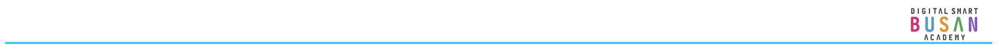

# 05 데이터 전처리


* 데이터 전처리(Data Preprocessing)은 ML 알고리즘만큼 중요함
* ML 알고리즘은 데이터 기반 -> 데이터에 따라 결과도 크게 달라짐

* 결손값  
  * Nan, Null
  * 어떻게 처리해야 할지는 경우에 따라 다름
    * 피처 중 Null값이 얼마 되지 않을 경우  
  :  피처의 평균값 등으로 간단히 대체 가능
    * Null값이 대부분  
  : 해당 피처를 제거하는 것이 좋음
    * Null값이 일정 수준 이상 되고, 중요한 피처일 경우  
  : 피처의 평균값으로 대체할 경우 예측 왜곡이 심할 수 있다면, 업무 로직 등을 상세히 검토해 더 정밀한 대체 값을 선정



### **데이터 인코딩**  
* 머신러닝 알고리즘은 문자열 값을 입력값으로 허용하지 않음
* 모든 문자열 값은 인코딩돼서 숫자 형으로 변환
* 대표적 인코딩 방식: 레이블 인코딩(Label encoding), 원-핫 인코딩(One Hot encoding)


* **레이블 인코딩(Label encoding)**
  * 카테고리 피처를 코드형 숫자 값으로 변환
  * ex) TV, 냉장고, 전자레인지, 컴퓨터, 선풍기, 믹서 -> 1, 2, 3, 4, 5, 6
  * 주의) '01', '02'은 문자열  
  * LabelEncoder를 객체로 생성한 후 fit()과 transform()을 호출해 레이블 인코딩을 수행

In [ ]:
from sklearn.preprocessing import LabelEncoder

items=['TV','냉장고','전자레인지','컴퓨터','선풍기','선풍기','믹서','믹서']

# LabelEncoder를 객체로 생성한 후 , fit( ) 과 transform( ) 으로 label 인코딩 수행.
encoder = LabelEncoder()
encoder.fit(items)
labels = encoder.transform(items)
print('인코딩 변환값:',labels)

인코딩 변환값: [0 1 4 5 3 3 2 2]


* TV는 0, 냉장고는 1, 전자레인지는 4, 컴퓨터는 5, 선풍기는 3, 믹서는 2로 변환


In [ ]:
# 문자열 값이 어떤 숫자 값으로 인코딩됐는지 확인: LabelEncoder 객체의 classes_ 속성값으로 확인
print('인코딩 클래스:',encoder.classes_)

인코딩 클래스: ['TV' '냉장고' '믹서' '선풍기' '전자레인지' '컴퓨터']


* classes_ 속성은 0번부터 순서대로 변환된 인코딩 값에 대한 원본값을 가지고 있다.
* 따라서 TV가 0, 냉장고 1, 믹서 2, 선풍기 3, 전자레인지 4, 컴퓨터가 5로 인코딩됐음을 알 수 있다.

In [ ]:
# inverse_transform() 을 통해 인코딩된 값을 다시 디코딩할 수 있다.
print('디코딩 원본 값:',encoder.inverse_transform([4, 5, 2, 0, 1, 1, 3, 3]))

디코딩 원본 값: ['전자레인지' '컴퓨터' '믹서' 'TV' '냉장고' '냉장고' '선풍기' '선풍기']


* Ex) 상품 분류를 레이블 인코딩

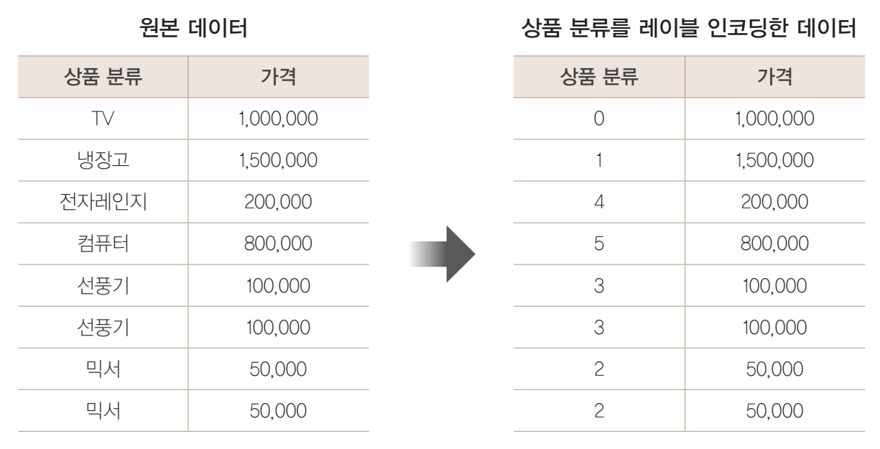

* 레이블 인코딩은 간단하게 문자열 값을 숫자형 카테고리 값으로 변환
* 하지만 예측 성능이 떨어지는 경우 발생
  * Ex) 냉장고: 1, 믹서: 2 -> 가중치 부여
* 이러한 특성 때문에 선형 회귀와 같은 ML 알고리즘에는 적용되지 않아야 함
* 하지만 트리 계열의 ML 알고리즘은 숫자의 이러한 특성 반영하지 않음 -> 레이블 인코딩 사용 가능
* 이러한 문제점 해결 : 원-핫 인코딩(One-Hot Encoding)

* **원-핫 인코딩(One-Hot encoding)**
  * 피처 값의 유형에 따라 새로운 피처를 추가해 고유 값에 해당하는 칼럼에만 1을 표시하고 나머지 칼럼에는 0을 표시하는 방식  
    * Ex) 아래 예시  
  * 사이킷런에서 OneHotEncdoer클래스로 변환 가능
  * OneHotEncdoer클래스 사용 시 주의사항  
  1) 입력값으로 2차원 데이터가 필요  
  2)  OneHotEncoder를 이용해 변환한 값이 희소 행렬(Sparse Matrix) 형태이므로 이를 다시 toarray()메서드를 이용해 밀집 행렬(Dense Matrix)로 변환해야 함


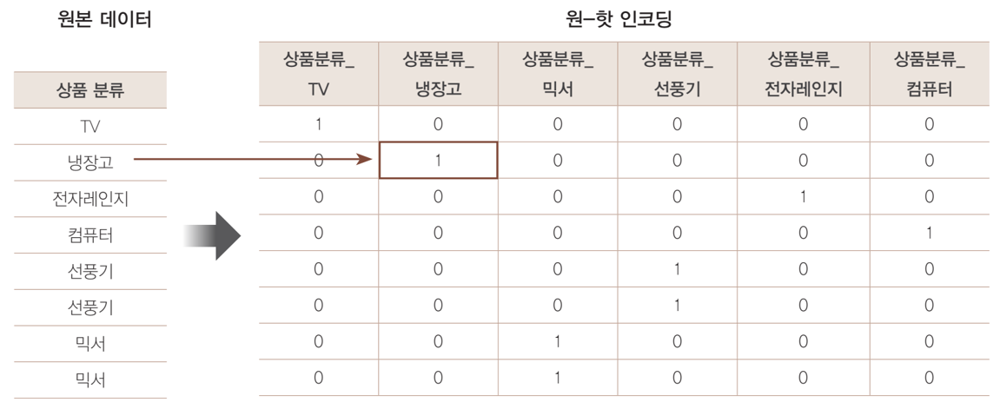

* 행 형태로 돼 있는 피처의 고유 값을 열 형태로 차원을 변환한 뒤, 고유 값에 해당하는 칼럼에만 1을 표시하고 나머지 칼럼에는 0을 표시 하며, 이러한 특성으로 원-핫(여러 개의 속성 중 단 한 개의 속성만 1로표시) 인코딩으로 명명

* 원-핫 인코딩은 사이킷런에서 OneHotEncoder 클래스 로 변환이 가능
* 약간 주의할 점으로, 입력값으로 2차원 데이터가 필요하다는 것과, OneHotEncoder 를 이용해 변환한 값이 희소 행렬(Sparse Matrix) 형태이므로 이를 다시 toarray() 메서드를 이용해 밀집행렬(Dense Matrix)로 변환해야 한다는 것


In [ ]:
# OneHotEncoder 를 이용해 앞의 데이터를 원-핫인코딩으로 변환
from sklearn.preprocessing import OneHotEncoder
import numpy as np

items=['TV','냉장고','전자레인지','컴퓨터','선풍기','선풍기','믹서','믹서']

# 2차원 ndarray로 변환합니다.
items = np.array(items).reshape(-1, 1)

# 원-핫 인코딩을 적용합니다.
oh_encoder = OneHotEncoder()
oh_encoder.fit(items)
oh_labels = oh_encoder.transform(items)

# OneHotEncoder로 변환한 결과는 희소행렬이므로 toarray()를 이용해 밀집 행렬로 변환.
print('원-핫 인코딩 데이터')
print(oh_labels.toarray())
print('원-핫 인코딩 데이터 차원')
print(oh_labels.shape)


원-핫 인코딩 데이터
[[1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]]
원-핫 인코딩 데이터 차원
(8, 6)


* 변환 절차

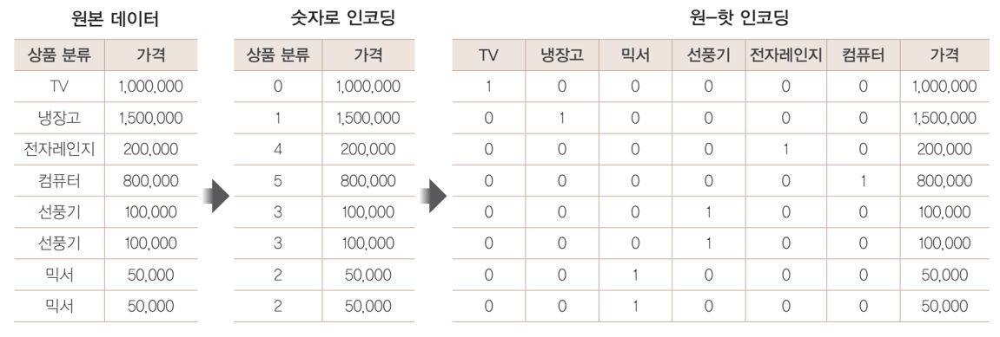

* 판다스에서 제공하는 원-핫 인코딩 API  
  * get_dummies()
  * 숫자 형으로 변환할 필요 없이 바로 변환 가능

In [ ]:
import pandas as pd

df = pd.DataFrame({'item':['TV','냉장고','전자레인지','컴퓨터','선풍기','선풍기','믹서','믹서'] })
pd.get_dummies(df,dtype=int)

,item_TV,item_냉장고,item_믹서,item_선풍기,item_전자레인지,item_컴퓨터
0,1,0,0,0,0,0
1,0,1,0,0,0,0
2,0,0,0,0,1,0
3,0,0,0,0,0,1
4,0,0,0,1,0,0
5,0,0,0,1,0,0
6,0,0,1,0,0,0
7,0,0,1,0,0,0


### **피처 스케일링과 정규화**
* 피처 스케일링(feature scaling): 서로 다른 변수의 값 범위를 일정한 수준으로 맞추는 작업
* 대표적인 방법: 표준화(Standardization), 정규화(Normalization)
* 표준화, 정규화를 하는 이유는?

* 표준화  
: 데이터의 피처 각각이 평균이 0이고 분산이 1인 가우시안 정규 분포를 가진 값으로 변환하는 것  

  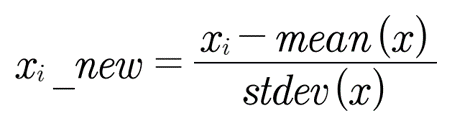

* 정규화  
: 서로 다른 피처의 크기를 통일하기 위해 크기를 변환해주는 것  

  * 정규화 방법 1)

  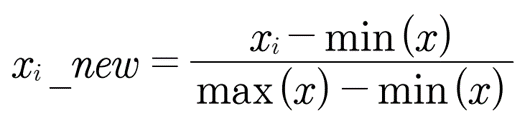

*
  * 정규화 방법2)  
  : 사이킷런의 Normalizer 모듈  
  선형대수에서의 정규화 개념 적용  
  개별 벡터를 모든 피처 벡터의 크기로 나눠줌

  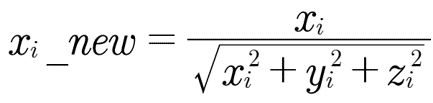


* 사이킷런에서 제공하는 대표적인 피처 스케일링 클래스
  * 표준화 - StandardScaler
  * 정규화 - MinMaxScaler

### **StandarScaler**
* 표준화를 쉽게 지원하기 위한 클래스
* 개별 피처를 평균이 0이고, 분산이 1인 값으로 변환
* 가우시안 정규 분포를 가질 수 있도록 데이터를 변환하는 것은 몇몇 알고리즘(데이터가 가우시안 분포를 가지고 있다고 가정하고 구현)에서 매우 중요

In [ ]:
from sklearn.datasets import load_iris
import pandas as pd
# 붓꽃 데이터 셋을 로딩하고 DataFrame으로 변환합니다.
iris = load_iris()
iris_data = iris.data
iris_df = pd.DataFrame(data=iris_data, columns=iris.feature_names)

print('feature 들의 평균 값')
print(iris_df.mean())
print('\nfeature 들의 분산 값')
print(iris_df.var())


feature 들의 평균 값
sepal length (cm)    5.843333
sepal width (cm)     3.057333
petal length (cm)    3.758000
petal width (cm)     1.199333
dtype: float64

feature 들의 분산 값
sepal length (cm)    0.685694
sepal width (cm)     0.189979
petal length (cm)    3.116278
petal width (cm)     0.581006
dtype: float64


In [ ]:
print(iris_df.max())
print(iris_df.min())

sepal length (cm)    7.9
sepal width (cm)     4.4
petal length (cm)    6.9
petal width (cm)     2.5
dtype: float64
sepal length (cm)    4.3
sepal width (cm)     2.0
petal length (cm)    1.0
petal width (cm)     0.1
dtype: float64


* fit(): 데이터 변환을 위한 기준 정보 설정
* transform(): 설정된 정보를 이용해 데이터 변환
* fit_transform(): fit()과 transform()을 한 번에 적용하는 기능 수행

In [ ]:
# StandardScaler 를 이용해 각 피처를 한 번에 표준화해 변환
# StandardScaler 객체를 생성한 후에 fit() 과 transform() 메서드에 변환 대상 피처 데이터 세트를 입력하고 호출하면 간단하게 변환
from sklearn.preprocessing import StandardScaler

# StandardScaler객체 생성
scaler = StandardScaler()
# StandardScaler 로 데이터 셋 변환. fit( ) 과 transform( ) 호출.
scaler.fit(iris_df)
iris_scaled = scaler.transform(iris_df)

#transform( )시 scale 변환된 데이터 셋이 numpy ndarry로 반환되어 이를 DataFrame으로 변환
iris_df_scaled = pd.DataFrame(data=iris_scaled, columns=iris.feature_names)
print('feature 들의 평균 값')
print(iris_df_scaled.mean())
print('\nfeature 들의 분산 값')
print(iris_df_scaled.var())

feature 들의 평균 값
sepal length (cm)   -1.690315e-15
sepal width (cm)    -1.842970e-15
petal length (cm)   -1.698641e-15
petal width (cm)    -1.409243e-15
dtype: float64

feature 들의 분산 값
sepal length (cm)    1.006711
sepal width (cm)     1.006711
petal length (cm)    1.006711
petal width (cm)     1.006711
dtype: float64


* 모든 칼럼 값의 평균이 0에 아주 가까운 값으로, 그리고 분산은 1에 아주 가까운 값으로 변환됐음을 알수 있다.

### MinMaxScaler
* 데이터값을 0과 1 사이의 범위 값으로 변환( 음수 값이 있으면 -1에서 1값으로 변환)
* 데이터의 분포가 가우시안 분포가 아닐 경우에 Min, Max Scale을 적용해 볼 수 있음

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# MinMaxScaler객체 생성
scaler = MinMaxScaler()
# MinMaxScaler 로 데이터 셋 변환. fit() 과 transform() 호출.
scaler.fit(iris_df)
iris_scaled = scaler.transform(iris_df)

# transform()시 scale 변환된 데이터 셋이 numpy ndarry로 반환되어 이를 DataFrame으로 변환
iris_df_scaled = pd.DataFrame(data=iris_scaled, columns=iris.feature_names)
print('feature들의 최솟값')
print(iris_df_scaled.min())
print('\nfeature들의 최댓값')
print(iris_df_scaled.max())


feature들의 최솟값
sepal length (cm)    0.0
sepal width (cm)     0.0
petal length (cm)    0.0
petal width (cm)     0.0
dtype: float64

feature들의 최댓값
sepal length (cm)    1.0
sepal width (cm)     1.0
petal length (cm)    1.0
petal width (cm)     1.0
dtype: float64


* 모든 피처에 0에서 1 사이의 값으로 변환되는 스케일링이 적용

### 학습 데이터와 테스트 데이터의 스케일링 변환 시 유의점

* 학습 데이터로 fit()이 적용된 스케일링 기준 정보를 그대로 테스트 데이터에 적용해야 함
* 그렇지 않고 테스트 데이터로 다시 새로운 스케일링 기준 정보를 만들게 되면 학습 데이터와 테스트 데이터의 스케일링 기준 정보가 서로 달라지게 됨

* Ex) 테스트 데이터에 fit()을 적용할 때 발생하는 문제점 예시

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# 학습 데이터는 0 부터 10까지, 테스트 데이터는 0 부터 5까지 값을 가지는 데이터 세트로 생성
# Scaler클래스의 fit(), transform()은 2차원 이상 데이터만 가능하므로 reshape(-1, 1)로 차원 변경
train_array = np.arange(0, 11).reshape(-1, 1)
test_array =  np.arange(0, 6).reshape(-1, 1)

In [ ]:
# 학습 데이터인 train_array부터 MinMaxScaler를 이용해 변환

# MinMaxScaler 객체에 별도의 feature_range 파라미터 값을 지정하지 않으면 0~1 값으로 변환
scaler = MinMaxScaler()

# fit()하게 되면 train_array 데이터의 최솟값이 0, 최댓값이 10으로 설정.
scaler.fit(train_array)

# 1/10 scale로 train_array 데이터 변환함. 원본 10-> 1로 변환됨.
train_scaled = scaler.transform(train_array)

print('원본 train_array 데이터:', np.round(train_array.reshape(-1), 2))
print('Scale된 train_array 데이터:', np.round(train_scaled.reshape(-1), 2))

원본 train_array 데이터: [ 0  1  2  3  4  5  6  7  8  9 10]
Scale된 train_array 데이터: [0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]


* 학습 데이터는 0부터 10까지 값을 가지는데,
  * 이 데이터에 MinMaxScaler 객체의 fit() 을 적용하면 최솟값 0, 최댓값 10이 설정되며 1/10 Scale이 적용되며,
  * transform() 을 호출하면 1/10 scale로 학습 데이터를 변환하게 되며
  * 원본 데이터 1은 0.1로 2는 0.2, 그리고 5는 0.5, 10은 1로 변환

In [ ]:
# 테스트 데이터 세트를 변환

# MinMaxScaler에 test_array를 fit()하게 되면 원본 데이터의 최솟값이 0, 최댓값이 5로 설정됨
scaler.fit(test_array)

# 1/5 scale로 test_array 데이터 변환함. 원본 5->1로 변환.
test_scaled = scaler.transform(test_array)

# test_array의 scale 변환 출력.
print('원본 test_array 데이터:', np.round(test_array.reshape(-1), 2))
print('Scale된 test_array 데이터:', np.round(test_scaled.reshape(-1), 2))


원본 test_array 데이터: [0 1 2 3 4 5]
Scale된 test_array 데이터: [0.  0.2 0.4 0.6 0.8 1. ]


* 위의 결과에서 학습 데이터와 테스트 데이터의 결과가 맞지 않음
  * 학습데이터: 1 -> 0.1 변경
  * 테스트 데이터: 1 -> 0.2 변경
  * 따라서 테스트 데이터에 다시 fit()을 적용하면 안됨  
  학습 데이터로 이미 fit()이 적용된 Scaler 객체를 이용해 transform()으로 변환해야 함


In [ ]:
# 테스트 데이터에 fit()을 호출하지 않고 학습 데이터로 fit()을 수행
# MinMaxScaler 객체의 transform() 을 이용해 데이터를 변환.
# 출력 결과를 확인해 보면 학습 데이터, 테스트 데이터 모두 동일하게 변환됐음을 확인

scaler = MinMaxScaler()
scaler.fit(train_array)
train_scaled = scaler.transform(train_array)
print('원본 train_array 데이터:', np.round(train_array.reshape(-1), 2))
print('Scale된 train_array 데이터:', np.round(train_scaled.reshape(-1), 2))

# test_array에 Scale 변환을 할 때는 반드시 fit()을 호출하지 않고 transform() 만으로 변환해야 함.
test_scaled = scaler.transform(test_array)
print('\n원본 test_array 데이터:', np.round(test_array.reshape(-1), 2))
print('Scale된 test_array 데이터:', np.round(test_scaled.reshape(-1), 2))


원본 train_array 데이터: [ 0  1  2  3  4  5  6  7  8  9 10]
Scale된 train_array 데이터: [0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]

원본 test_array 데이터: [0 1 2 3 4 5]
Scale된 test_array 데이터: [0.  0.1 0.2 0.3 0.4 0.5]


* 학습 데이터와 테스트 데이터의 fit(), transform(), fit_transform()을 이용해 스케일링 변환 시 유의할 점
  * 가능하다면 전체 데이터의 스케일링 변환을 적용한 뒤 학습과 테스트 데이터로 분리
  * 위의 경우가 여의치 않다면 테스트 데이터 변환 시에는 fit()이나 fit_transform()을 적용하지 않고 학습 데이터로 이미 fit()된 Scaler 객체를 이용해 transform()으로 변환

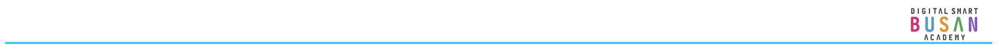

# 06 사이킷런으로 수행하는 타이타닉 생존자 예측

* 캐글에서 제공하는 타이타닉 탑승자 데이터를 기반으로 생존자 예측을 사이킷런으로 수행  

* 타이타닉 탑승자 데이터
  * Passengerid:탑승자 데이터 일련번호
  * survived: 생존 여부, 0=사망, 1=생존
  * pclass: 티켓의 선실 등급, 1=일등석, 2=이등석, 3=삼등석
  * sex: 탑승자 성별
  * name: 탑승자 이름
  * Age: 탑승자 나이
  * sibsp: 같이 탑승한 형제자매 또는 배우자 인원수
  * parch: 같이 탑승한 부모님 또는 어린이 인원수
  * ticket: 티켓 번호
  * fare: 요금
  * cabin: 선실 번호
  * embarked: 중간 정착 항구 C=Cherbourg, Q=Queenstown, S=Southampton


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from google.colab import drive
drive.mount('/content/drive')
file_path = ('/content/drive/MyDrive/data_머신러닝/titanic_train.csv')

titanic_df = pd.read_csv(file_path)
titanic_df.head(3)

Mounted at /content/drive


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S


In [ ]:
# 로딩된 데이터 칼럼 타입 확인
print('\n ### train 데이터 정보 ###  \n')
print(titanic_df.info())


 ### train 데이터 정보 ###  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB
None


In [ ]:
# 수치형 데이터 요약 통계
print('\n ### train 수치형 데이터 요약 ###  \n')
print(titanic_df.describe())


 ### train 수치형 데이터 요약 ###  

       PassengerId    Survived      Pclass         Age       SibSp  \
count   891.000000  891.000000  891.000000  714.000000  891.000000   
mean    446.000000    0.383838    2.308642   29.699118    0.523008   
std     257.353842    0.486592    0.836071   14.526497    1.102743   
min       1.000000    0.000000    1.000000    0.420000    0.000000   
25%     223.500000    0.000000    2.000000   20.125000    0.000000   
50%     446.000000    0.000000    3.000000   28.000000    0.000000   
75%     668.500000    1.000000    3.000000   38.000000    1.000000   
max     891.000000    1.000000    3.000000   80.000000    8.000000   

            Parch        Fare  
count  891.000000  891.000000  
mean     0.381594   32.204208  
std      0.806057   49.693429  
min      0.000000    0.000000  
25%      0.000000    7.910400  
50%      0.000000   14.454200  
75%      0.000000   31.000000  
max      6.000000  512.329200  


* Null 값
  * Age, Cabin, Embarked는 각각 177, 608, 2개의 Null(NaN)을 갖고 있음

* 사이킷런 머신러닝 알고리즘은 Null 값을 허용하지 않음
  * 여기서는 간단하게 Null값을 평균 또는 고정 값으로 변경
  * Age는 평균 나이, 나머지는 'N' 값으로 변경

In [ ]:
titanic_df['Age'].fillna(titanic_df['Age'].mean(),inplace=True)
titanic_df['Cabin'].fillna('N',inplace=True)
titanic_df['Embarked'].fillna('N',inplace=True)
print('데이터 세트 Null 값 갯수 ',titanic_df.isnull().sum().sum())

데이터 세트 Null 값 갯수  0


In [ ]:
print(' Sex 값 분포 :\n',titanic_df['Sex'].value_counts())
print('\n Cabin 값 분포 :\n',titanic_df['Cabin'].value_counts())
print('\n Embarked 값 분포 :\n',titanic_df['Embarked'].value_counts())

 Sex 값 분포 :
 Sex
male      577
female    314
Name: count, dtype: int64

 Cabin 값 분포 :
 Cabin
N              687
C23 C25 C27      4
G6               4
B96 B98          4
C22 C26          3
              ... 
E34              1
C7               1
C54              1
E36              1
C148             1
Name: count, Length: 148, dtype: int64

 Embarked 값 분포 :
 Embarked
S    644
C    168
Q     77
N      2
Name: count, dtype: int64


* 위의 결과에서  
  * Cabin(선실)의 경우 N이 687건으로 가장 많음  
  * 'C23 C25 C27'과 같이 여러 Cabin이 한꺼번에 표기
  * 선실 등급을 나타내는 첫 번째 알파벳이 중요하기 때문에, Cabin 속성에서는 앞 문자만 추출


In [ ]:
titanic_df['Cabin'] = titanic_df['Cabin'].str[:1]
print(titanic_df['Cabin'].head())

0    N
1    C
2    N
3    C
4    N
Name: Cabin, dtype: object


* 데이터 탐색  
어떤 유형의 승객이 생존 확률이 높았는지 확인

In [ ]:
# 성별이 생존 확률에 어떤 영향을 미쳤는지, 성별에 따른 생존자 수 비교 (Survived - 0=사망, 1=생존)
titanic_df.groupby(['Sex','Survived'])['Survived'].count()

Sex     Survived
female  0            81
        1           233
male    0           468
        1           109
Name: Survived, dtype: int64

<Axes: xlabel='Sex', ylabel='Survived'>

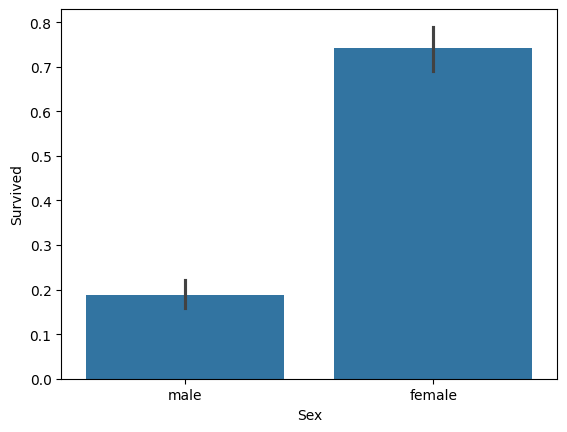

In [ ]:
sns.barplot(x='Sex', y = 'Survived', data=titanic_df)

<Axes: xlabel='Pclass', ylabel='Survived'>

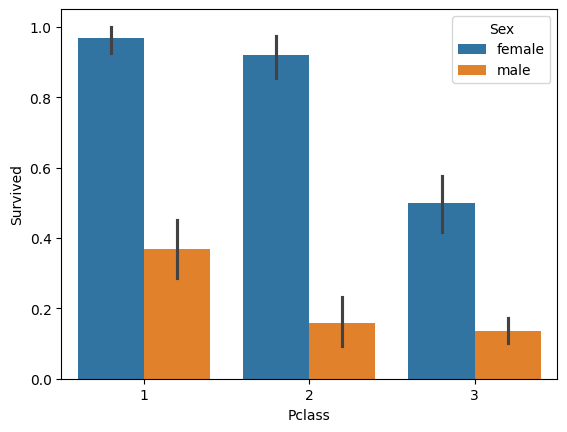

In [ ]:
# 객실 등급 별 성별에 따른 생존 확률
sns.barplot(x='Pclass', y='Survived', hue='Sex', data=titanic_df)

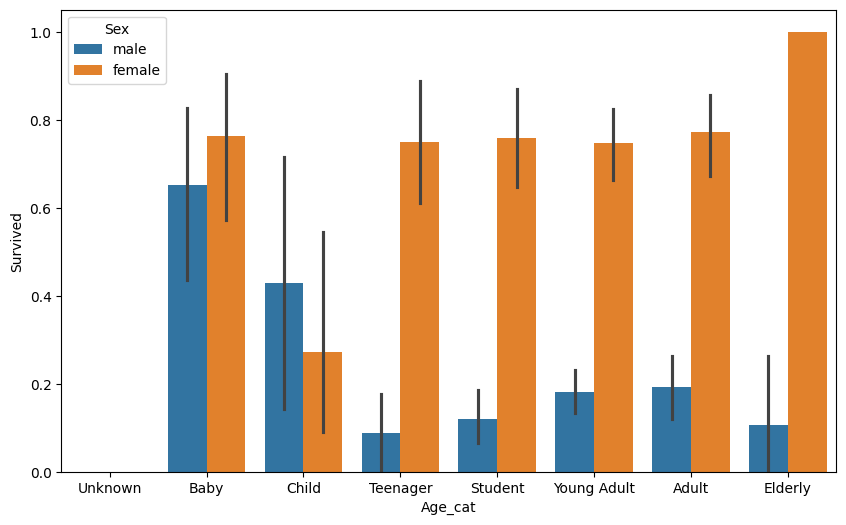

In [ ]:
# Age에 따른 생존 확률

# 입력 age에 따라 구분값을 반환하는 함수 설정. DataFrame의 apply lambda식에 사용.
def get_category(age):
    cat = ''
    if age <= -1: cat = 'Unknown'
    elif age <= 5: cat = 'Baby'
    elif age <= 12: cat = 'Child'
    elif age <= 18: cat = 'Teenager'
    elif age <= 25: cat = 'Student'
    elif age <= 35: cat = 'Young Adult'
    elif age <= 60: cat = 'Adult'
    else : cat = 'Elderly'

    return cat

# 막대그래프의 크기 figure를 더 크게 설정
plt.figure(figsize=(10,6))

#X축의 값을 순차적으로 표시하기 위한 설정
group_names = ['Unknown', 'Baby', 'Child', 'Teenager', 'Student', 'Young Adult', 'Adult', 'Elderly']

# lambda 식에 위에서 생성한 get_category( ) 함수를 반환값으로 지정.
# get_category(X)는 입력값으로 'Age' 컬럼값을 받아서 해당하는 cat 반환
titanic_df['Age_cat'] = titanic_df['Age'].apply(lambda x : get_category(x))
sns.barplot(x='Age_cat', y = 'Survived', hue='Sex', data=titanic_df, order=group_names)
titanic_df.drop('Age_cat', axis=1, inplace=True)

* 생존율이 높은 항목은?
* 생존을 좌우하는 피처는?

In [ ]:
# 문자열 카테고리 피처를 숫자형 카테고리 피처로 변환
from sklearn import preprocessing

# LabelEncoder: 카테고리 값의 유형 수에 따라 0~(카테고리 유형 수-1)까지의 숫자 값으로 변환
def encode_features(dataDF):
    features = ['Cabin', 'Sex', 'Embarked']
    for feature in features:
        le = preprocessing.LabelEncoder()
        le = le.fit(dataDF[feature])
        dataDF[feature] = le.transform(dataDF[feature])

    return dataDF

titanic_df = encode_features(titanic_df)

# Sex, Cabin, Embarked 가 숫자로 변경되었음을 확인
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",1,22.0,1,0,A/5 21171,7.2500,7,3
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",0,38.0,1,0,PC 17599,71.2833,2,0
2,3,1,3,"Heikkinen, Miss. Laina",0,26.0,0,0,STON/O2. 3101282,7.9250,7,3
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",0,35.0,1,0,113803,53.1000,2,3
4,5,0,3,"Allen, Mr. William Henry",1,35.0,0,0,373450,8.0500,7,3


* 데이터 전처리 수행 함수: transform_feature()함수

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Null 처리 함수
def fillna(df):
    df['Age'].fillna(df['Age'].mean(), inplace=True)
    df['Cabin'].fillna('N', inplace=True)
    df['Embarked'].fillna('N', inplace=True)
    df['Fare'].fillna(0, inplace=True)
    return df

# 머신러닝 알고리즘에 불필요한 피처 제거
def drop_features(df):
    df.drop(['PassengerId', 'Name', 'Ticket'], axis=1, inplace=True)
    return df

# 레이블 인코딩 수행.
def format_features(df):
    df['Cabin'] = df['Cabin'].str[:1]
    features = ['Cabin', 'Sex', 'Embarked']
    for feature in features:
        le = LabelEncoder()
        le = le.fit(df[feature])
        df[feature] = le.transform(df[feature])
    return df

# 앞에서 설정한 데이터 전처리 함수 호출
def transform_features(df):
    df = fillna(df)
    df = drop_features(df)
    df = format_features(df)
    return df

In [ ]:
# 원본 데이터를 재로딩 하고, feature데이터 셋과 Label 데이터 셋 추출.
from google.colab import drive
drive.mount('/content/drive')
file_path = ('/content/drive/MyDrive/data_머신러닝/titanic_train.csv')

titanic_df = pd.read_csv(file_path)
y_titanic_df = titanic_df['Survived']
X_titanic_df= titanic_df.drop('Survived',axis=1)

X_titanic_df = transform_features(X_titanic_df)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X_titanic_df, y_titanic_df, \
                                                  test_size=0.2, random_state=11)


* 사이킷런 기반 ML 알고리즘인 결정트리, 랜덤 포레스트, 로지스틱 회귀를 이용해 타이타닉 생존자 예측  
  * 이 알고리즘에 대한 상세 설명은 뒤에서 자세히 설명 할 예정
  * 사이킷런 기반의 머신러닝 코드에 익숙해지는데 집중

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# 결정트리, Random Forest, 로지스틱 회귀를 위한 사이킷런 Classifier 클래스 생성
dt_clf = DecisionTreeClassifier(random_state=11)
rf_clf = RandomForestClassifier(random_state=11)
lr_clf = LogisticRegression(solver='liblinear')

# DecisionTreeClassifier 학습/예측/평가
dt_clf.fit(X_train , y_train)
dt_pred = dt_clf.predict(X_test)
print('DecisionTreeClassifier 정확도: {0:.4f}'.format(accuracy_score(y_test, dt_pred)))

# RandomForestClassifier 학습/예측/평가
rf_clf.fit(X_train , y_train)
rf_pred = rf_clf.predict(X_test)
print('RandomForestClassifier 정확도:{0:.4f}'.format(accuracy_score(y_test, rf_pred)))

# LogisticRegression 학습/예측/평가
lr_clf.fit(X_train , y_train)
lr_pred = lr_clf.predict(X_test)
print('LogisticRegression 정확도: {0:.4f}'.format(accuracy_score(y_test, lr_pred)))


DecisionTreeClassifier 정확도: 0.7877
RandomForestClassifier 정확도:0.8547
LogisticRegression 정확도: 0.8659


* 교차검증  
  * 사이킷런 model_selection 패키지의 KFold 클래스, cross_val_score(), GridSearchCV 클래스 모두 사용

In [ ]:
# 1) KFold 클래스

from sklearn.model_selection import KFold

def exec_kfold(clf, folds=5):
    # 폴드 세트를 5개인 KFold객체를 생성, 폴드 수만큼 예측결과 저장을 위한  리스트 객체 생성.
    kfold = KFold(n_splits=folds)
    scores = []

    # KFold 교차 검증 수행.
    for iter_count , (train_index, test_index) in enumerate(kfold.split(X_titanic_df)):
        # X_titanic_df 데이터에서 교차 검증별로 학습과 검증 데이터를 가리키는 index 생성
        X_train, X_test = X_titanic_df.values[train_index], X_titanic_df.values[test_index]
        y_train, y_test = y_titanic_df.values[train_index], y_titanic_df.values[test_index]

        # Classifier 학습, 예측, 정확도 계산
        clf.fit(X_train, y_train)
        predictions = clf.predict(X_test)
        accuracy = accuracy_score(y_test, predictions)
        scores.append(accuracy)
        print("교차 검증 {0} 정확도: {1:.4f}".format(iter_count, accuracy))

    # 5개 fold에서의 평균 정확도 계산.
    mean_score = np.mean(scores)
    print("평균 정확도: {0:.4f}".format(mean_score))
# exec_kfold 호출
exec_kfold(dt_clf , folds=5)


교차 검증 0 정확도: 0.7542
교차 검증 1 정확도: 0.7809
교차 검증 2 정확도: 0.7865
교차 검증 3 정확도: 0.7697
교차 검증 4 정확도: 0.8202
평균 정확도: 0.7823


In [ ]:
# 2) cross_val_score() API

from sklearn.model_selection import cross_val_score

scores = cross_val_score(dt_clf, X_titanic_df, y_titanic_df, cv=5)

for iter_count, accuracy in enumerate(scores):
  print("교차 검증{0} 정확도: {1:.4f}".format(iter_count, accuracy))

print("평균 정확도: {0:.4f}".format(np.mean(scores)))

교차 검증0 정확도: 0.7430
교차 검증1 정확도: 0.7753
교차 검증2 정확도: 0.7921
교차 검증3 정확도: 0.7865
교차 검증4 정확도: 0.8427
평균 정확도: 0.7879


In [ ]:
# 3) GridSearchCV
# 하이퍼 파라미터: max_depth, min_samples_split, min_samples_leaf

from sklearn.model_selection import GridSearchCV

parameters = {'max_depth':[2,3,5,10],
             'min_samples_split':[2,3,5], 'min_samples_leaf':[1,5,8]}

grid_dclf = GridSearchCV(dt_clf , param_grid=parameters , scoring='accuracy' , cv=5)
grid_dclf.fit(X_train , y_train)

print('GridSearchCV 최적 하이퍼 파라미터 :',grid_dclf.best_params_)
print('GridSearchCV 최고 정확도: {0:.4f}'.format(grid_dclf.best_score_))
best_dclf = grid_dclf.best_estimator_

# GridSearchCV의 최적 하이퍼 파라미터로 학습된 Estimator로 예측 및 평가 수행.
dpredictions = best_dclf.predict(X_test)
accuracy = accuracy_score(y_test , dpredictions)
print('테스트 세트에서의 DecisionTreeClassifier 정확도 : {0:.4f}'.format(accuracy))


GridSearchCV 최적 하이퍼 파라미터 : {'max_depth': 3, 'min_samples_leaf': 5, 'min_samples_split': 2}
GridSearchCV 최고 정확도: 0.7992
테스트 세트에서의 DecisionTreeClassifier 정확도 : 0.8715


## **[연습]사이킷런의 당뇨병 예제 문제**
* [참고] https://sevillabk.github.io/pima-eval/

1) 학습 데이터와 테스트 데이터 분리  
2) 트리 모델 사용  
3) 하이퍼 파라미터 사용 ('max_depth', 'min_samples_split')  
4) GridSearchCV 사용 ( cv=3)  
5) 하이퍼 파라미터 순차적으로 학습/ 평가  
6) 최적 하이퍼 파라미터로 학습 후 정확도 확인

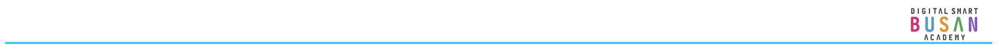